Customer Segmentation and Recommendation System

In [1]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors as mcolors
from scipy.stats import linregress
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans
from tabulate import tabulate
from collections import Counter

%matplotlib inline

In [2]:
!pip install deap

In [3]:
#Import Relevant Libraries
import pandas as pd 
import numpy as np
import statsmodels.api as sm 
import matplotlib.pyplot as plt 
import statistics
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
from sklearn import metrics
from deap import algorithms
from deap import base
from deap import creator
from deap import tools
import seaborn as sns 
sns.set() 
from sklearn.cluster import KMeans 
import warnings 
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt 
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import Birch
from numpy import unique

In [4]:
# Initialize Plotly for use in the notebook
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

In [5]:
# Configure Seaborn plot styles: Set background color and use dark grid
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')

In [6]:
df = pd.read_excel(r"C:\NITIE Modules\Module 6\Capstone Project 1\Online Retail.xlsx")

Initial Data Analysis

In [7]:
df.head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [9]:
# Summary statistics for numerical variables
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Quantity,541909.0,9.552250,218.081158,-80995.00,1.00,3.00,10.00,80995.0
UnitPrice,541909.0,4.611114,96.759853,-11062.06,1.25,2.08,4.13,38970.0
CustomerID,406829.0,15287.690570,1713.600303,12346.00,13953.00,15152.00,16791.00,18287.0


In [10]:
# Summary statistics for categorical variables
df.describe(include='object').T

,count,unique,top,freq
InvoiceNo,541909,25900,573585,1114
StockCode,541909,4070,85123A,2313
Description,540455,4223,WHITE HANGING HEART T-LIGHT HOLDER,2369
Country,541909,38,United Kingdom,495478


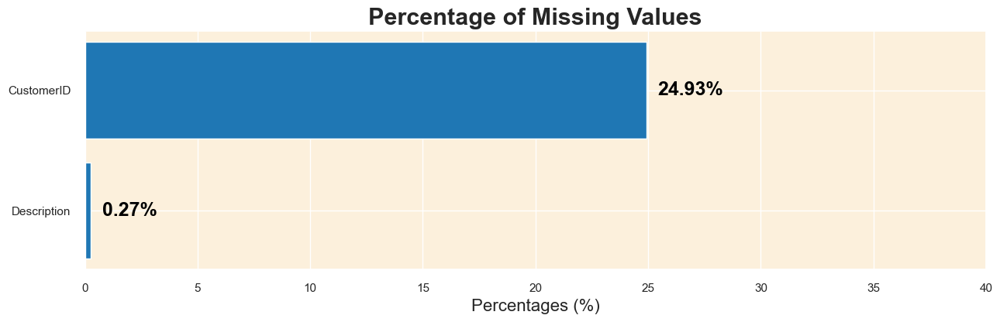

In [11]:
# Calculating the percentage of missing values for each column
missing_data = df.isnull().sum()
missing_percentage = (missing_data[missing_data > 0] / df.shape[0]) * 100

# Prepare values
missing_percentage.sort_values(ascending=True, inplace=True)

# Plot the barh chart
fig, ax = plt.subplots(figsize=(15, 4))
ax.barh(missing_percentage.index, missing_percentage, color='#1f77b4')

# Annotate the values and indexes
for i, (value, name) in enumerate(zip(missing_percentage, missing_percentage.index)):
    ax.text(value+0.5, i, f"{value:.2f}%", ha='left', va='center', fontweight='bold', fontsize=18, color='black')

# Set x-axis limit
ax.set_xlim([0, 40])

# Add title and xlabel
plt.title("Percentage of Missing Values", fontweight='bold', fontsize=22)
plt.xlabel('Percentages (%)', fontsize=16)
plt.show()

In [12]:
# Extracting rows with missing values in 'CustomerID' or 'Description' columns
df[df['CustomerID'].isnull() | df['Description'].isnull()].head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,2010-12-01 14:32:00,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,2010-12-01 14:32:00,1.66,NaN,United Kingdom


In [13]:
# Removing rows with missing values in 'CustomerID' and 'Description' columns
df = df.dropna(subset=['CustomerID', 'Description'])

In [14]:
# Verifying the removal of missing values
df.isnull().sum().sum()

0

In [15]:
# Finding duplicate rows (keeping all instances)
duplicate_rows = df[df.duplicated(keep=False)]

# Sorting the data by certain columns to see the duplicate rows next to each other
duplicate_rows_sorted = duplicate_rows.sort_values(by=['InvoiceNo', 'StockCode', 'Description', 'CustomerID', 'Quantity'])

# Displaying the first 10 records
duplicate_rows_sorted.head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
539,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
527,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
537,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
578,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom
598,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom


In [16]:
# Displaying the number of duplicate rows
print(f"The dataset contains {df.duplicated().sum()} duplicate rows that need to be removed.")

# Removing duplicate rows
df.drop_duplicates(inplace=True)

The dataset contains 5225 duplicate rows that need to be removed.


In [17]:
# Getting the number of rows in the dataframe
df.shape[0]

401604

In [18]:
# Filter out the rows with InvoiceNo starting with "C" and create a new column indicating the transaction status
df['Transaction_Status'] = np.where(df['InvoiceNo'].astype(str).str.startswith('C'), 'Cancelled', 'Completed')

# Analyze the characteristics of these rows (considering the new column)
cancelled_transactions = df[df['Transaction_Status'] == 'Cancelled']
cancelled_transactions.describe().drop('CustomerID', axis=1)

,Quantity,UnitPrice
count,8872.000000,8872.000000
mean,-30.774910,18.899512
std,1172.249902,445.190864
min,-80995.000000,0.010000
25%,-6.000000,1.450000
50%,-2.000000,2.950000
75%,-1.000000,4.950000
max,-1.000000,38970.000000


In [19]:
df['Transaction_Status'].head()

0    Completed
1    Completed
2    Completed
3    Completed
4    Completed
Name: Transaction_Status, dtype: object

In [20]:
# Finding the percentage of cancelled transactions
cancelled_percentage = (cancelled_transactions.shape[0] / df.shape[0]) * 100

# Printing the percentage of cancelled transactions
print(f"The percentage of cancelled transactions in the dataset is: {cancelled_percentage:.2f}%")

The percentage of cancelled transactions in the dataset is: 2.21%


In [21]:
# Finding the number of unique stock codes
unique_stock_codes = df['StockCode'].nunique()

# Printing the number of unique stock codes
print(f"The number of unique stock codes in the dataset is: {unique_stock_codes}")

The number of unique stock codes in the dataset is: 3684


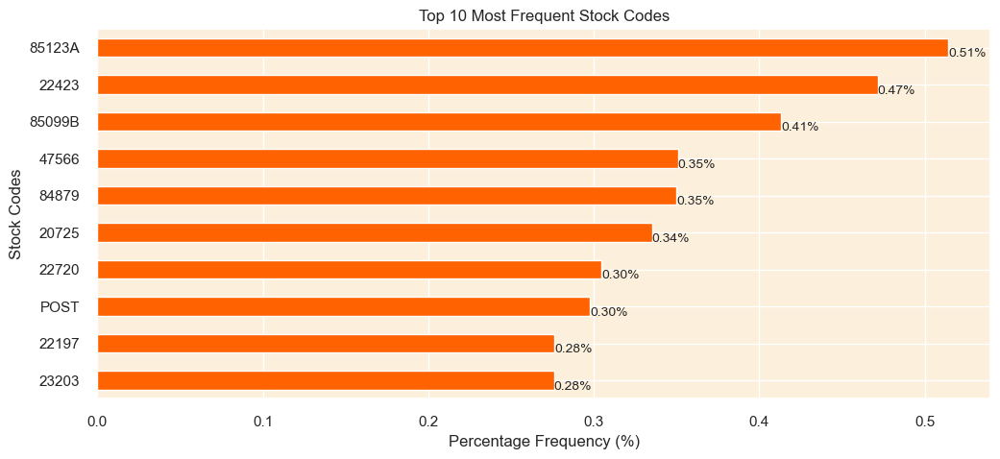

In [22]:
# Finding the top 10 most frequent stock codes
top_10_stock_codes = df['StockCode'].value_counts(normalize=True).head(10) * 100

# Plotting the top 10 most frequent stock codes
plt.figure(figsize=(12, 5))
top_10_stock_codes.plot(kind='barh', color='#ff6200')

# Adding the percentage frequency on the bars
for index, value in enumerate(top_10_stock_codes):
    plt.text(value, index+0.25, f'{value:.2f}%', fontsize=10)

plt.title('Top 10 Most Frequent Stock Codes')
plt.xlabel('Percentage Frequency (%)')
plt.ylabel('Stock Codes')
plt.gca().invert_yaxis()
plt.show()

In [23]:
# Finding the number of numeric characters in each unique stock code
unique_stock_codes = df['StockCode'].unique()
numeric_char_counts_in_unique_codes = pd.Series(unique_stock_codes).apply(lambda x: sum(c.isdigit() for c in str(x))).value_counts()

# Printing the value counts for unique stock codes
print("Value counts of numeric character frequencies in unique stock codes:")
print("-"*70)
print(numeric_char_counts_in_unique_codes)

Value counts of numeric character frequencies in unique stock codes:
----------------------------------------------------------------------
5    3676
0       7
1       1
dtype: int64


In [24]:
# Finding and printing the stock codes with 0 and 1 numeric characters
anomalous_stock_codes = [code for code in unique_stock_codes if sum(c.isdigit() for c in str(code)) in (0, 1)]

# Printing each stock code on a new line
print("Anomalous stock codes:")
print("-"*22)
for code in anomalous_stock_codes:
    print(code)

Anomalous stock codes:
----------------------
POST
D
C2
M
BANK CHARGES
PADS
DOT
CRUK


In [25]:
# Calculating the percentage of records with these stock codes
percentage_anomalous = (df['StockCode'].isin(anomalous_stock_codes).sum() / len(df)) * 100

# Printing the percentage
print(f"The percentage of records with anomalous stock codes in the dataset is: {percentage_anomalous:.2f}%")

The percentage of records with anomalous stock codes in the dataset is: 0.48%


In [26]:
# Removing rows with anomalous stock codes from the dataset
df = df[~df['StockCode'].isin(anomalous_stock_codes)]
# Getting the number of rows in the dataframe
df.shape[0]

399689

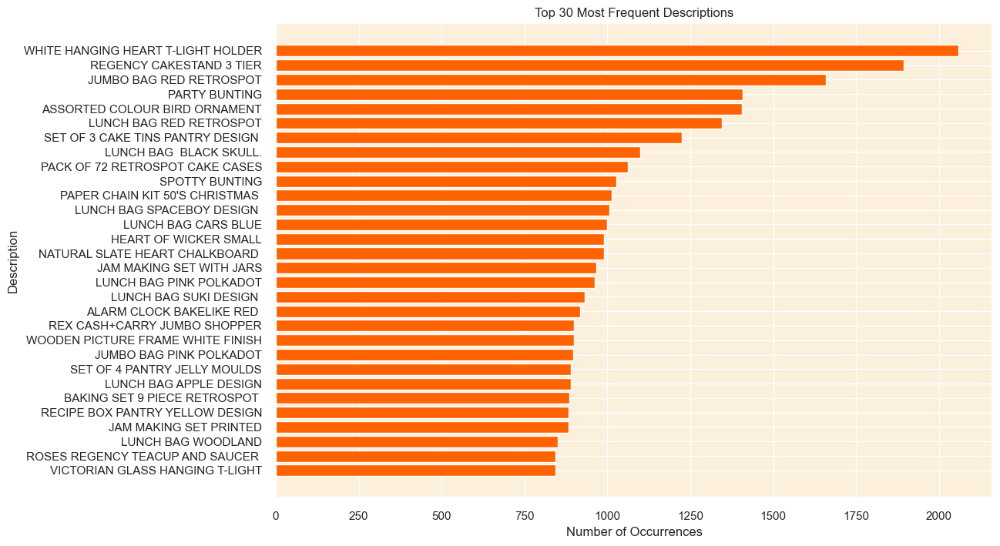

In [27]:
# Calculate the occurrence of each unique description and sort them
description_counts = df['Description'].value_counts()

# Get the top 30 descriptions
top_30_descriptions = description_counts[:30]

# Plotting
plt.figure(figsize=(12,8))
plt.barh(top_30_descriptions.index[::-1], top_30_descriptions.values[::-1], color='#ff6200')

# Adding labels and title
plt.xlabel('Number of Occurrences')
plt.ylabel('Description')
plt.title('Top 30 Most Frequent Descriptions')

# Show the plot
plt.show()

In [28]:
# Find unique descriptions containing lowercase characters
lowercase_descriptions = df['Description'].unique()
lowercase_descriptions = [desc for desc in lowercase_descriptions if any(char.islower() for char in desc)]

# Print the unique descriptions containing lowercase characters
print("The unique descriptions containing lowercase characters are:")
print("-"*60)
for desc in lowercase_descriptions:
    print(desc)

The unique descriptions containing lowercase characters are:
------------------------------------------------------------
BAG 500g SWIRLY MARBLES
POLYESTER FILLER PAD 45x45cm
POLYESTER FILLER PAD 45x30cm
POLYESTER FILLER PAD 40x40cm
FRENCH BLUE METAL DOOR SIGN No
BAG 250g SWIRLY MARBLES
BAG 125g SWIRLY MARBLES
3 TRADITIONAl BISCUIT CUTTERS  SET
NUMBER TILE COTTAGE GARDEN No
FOLK ART GREETING CARD,pack/12
ESSENTIAL BALM 3.5g TIN IN ENVELOPE
POLYESTER FILLER PAD 65CMx65CM
NUMBER TILE VINTAGE FONT No 
POLYESTER FILLER PAD 30CMx30CM
POLYESTER FILLER PAD 60x40cm
FLOWERS HANDBAG blue and orange
Next Day Carriage
THE KING GIFT BAG 25x24x12cm
High Resolution Image


In [29]:
service_related_descriptions = ["Next Day Carriage", "High Resolution Image"]

# Calculate the percentage of records with service-related descriptions
service_related_percentage = df[df['Description'].isin(service_related_descriptions)].shape[0] / df.shape[0] * 100

# Print the percentage of records with service-related descriptions
print(f"The percentage of records with service-related descriptions in the dataset is: {service_related_percentage:.2f}%")

# Remove rows with service-related information in the description
df = df[~df['Description'].isin(service_related_descriptions)]

# Standardize the text to uppercase to maintain uniformity across the dataset
df['Description'] = df['Description'].str.upper()

# Getting the number of rows in the dataframe
df.shape[0]

The percentage of records with service-related descriptions in the dataset is: 0.02%


399606

In [30]:
df['UnitPrice'].describe()

count    399606.000000
mean          2.904957
std           4.448796
min           0.000000
25%           1.250000
50%           1.950000
75%           3.750000
max         649.500000
Name: UnitPrice, dtype: float64

In [31]:
df[df['UnitPrice']==0].describe()[['Quantity']]

,Quantity
count,33.000000
mean,420.515152
std,2176.713608
min,1.000000
25%,2.000000
50%,11.000000
75%,36.000000
max,12540.000000


In [32]:
# Removing records with a unit price of zero to avoid potential data entry errors
df = df[df['UnitPrice'] > 0]

In [33]:
# Resetting the index of the cleaned dataset
df.reset_index(drop=True, inplace=True)
# Getting the number of rows in the dataframe
df.shape[0]

399573

Feature Engineering

Recency

In [34]:
# Convert InvoiceDate to datetime type
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Convert InvoiceDate to datetime and extract only the date
df['InvoiceDay'] = df['InvoiceDate'].dt.date

# Find the most recent purchase date for each customer
customer_data = df.groupby('CustomerID')['InvoiceDay'].max().reset_index()

# Find the most recent date in the entire dataset
most_recent_date = df['InvoiceDay'].max()

# Convert InvoiceDay to datetime type before subtraction
customer_data['InvoiceDay'] = pd.to_datetime(customer_data['InvoiceDay'])
most_recent_date = pd.to_datetime(most_recent_date)

# Calculate the number of days since the last purchase for each customer
customer_data['Days_Since_Last_Purchase'] = (most_recent_date - customer_data['InvoiceDay']).dt.days

# Remove the InvoiceDay column
customer_data.drop(columns=['InvoiceDay'], inplace=True)

customer_data.head()

,CustomerID,Days_Since_Last_Purchase
0,12346.0,325
1,12347.0,2
2,12348.0,75
3,12349.0,18
4,12350.0,310


Frequency

In [35]:
# Calculate the total number of transactions made by each customer
total_transactions = df.groupby('CustomerID')['InvoiceNo'].nunique().reset_index()
total_transactions.rename(columns={'InvoiceNo': 'Total_Transactions'}, inplace=True)

# Calculate the total number of products purchased by each customer
total_products_purchased = df.groupby('CustomerID')['Quantity'].sum().reset_index()
total_products_purchased.rename(columns={'Quantity': 'Total_Products_Purchased'}, inplace=True)

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, total_transactions, on='CustomerID')
customer_data = pd.merge(customer_data, total_products_purchased, on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased
0,12346.0,325,2,0
1,12347.0,2,7,2458
2,12348.0,75,4,2332
3,12349.0,18,1,630
4,12350.0,310,1,196


Monetary

In [36]:
# Calculate the total spend by each customer
df['Total_Spend'] = df['UnitPrice'] * df['Quantity']
total_spend = df.groupby('CustomerID')['Total_Spend'].sum().reset_index()

# Calculate the average transaction value for each customer
average_transaction_value = total_spend.merge(total_transactions, on='CustomerID')
average_transaction_value['Average_Transaction_Value'] = average_transaction_value['Total_Spend'] / average_transaction_value['Total_Transactions']

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, total_spend, on='CustomerID')
customer_data = pd.merge(customer_data, average_transaction_value[['CustomerID', 'Average_Transaction_Value']], on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value
0,12346.0,325,2,0,0.00,0.000000
1,12347.0,2,7,2458,4310.00,615.714286
2,12348.0,75,4,2332,1437.24,359.310000
3,12349.0,18,1,630,1457.55,1457.550000
4,12350.0,310,1,196,294.40,294.400000


Product Diversity

In [37]:
# Calculate the number of unique products purchased by each customer
unique_products_purchased = df.groupby('CustomerID')['StockCode'].nunique().reset_index()
unique_products_purchased.rename(columns={'StockCode': 'Unique_Products_Purchased'}, inplace=True)

# Merge the new feature into the customer_data dataframe
customer_data = pd.merge(customer_data, unique_products_purchased, on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased
0,12346.0,325,2,0,0.00,0.000000,1
1,12347.0,2,7,2458,4310.00,615.714286,103
2,12348.0,75,4,2332,1437.24,359.310000,21
3,12349.0,18,1,630,1457.55,1457.550000,72
4,12350.0,310,1,196,294.40,294.400000,16


Behavioral Features

In [38]:
# Extract day of week and hour from InvoiceDate
df['Day_Of_Week'] = df['InvoiceDate'].dt.dayofweek
df['Hour'] = df['InvoiceDate'].dt.hour

# Calculate the average number of days between consecutive purchases
days_between_purchases = df.groupby('CustomerID')['InvoiceDay'].apply(lambda x: (x.diff().dropna()).apply(lambda y: y.days))
average_days_between_purchases = days_between_purchases.groupby('CustomerID').mean().reset_index()
average_days_between_purchases.rename(columns={'InvoiceDay': 'Average_Days_Between_Purchases'}, inplace=True)

# Find the favorite shopping day of the week
favorite_shopping_day = df.groupby(['CustomerID', 'Day_Of_Week']).size().reset_index(name='Count')
favorite_shopping_day = favorite_shopping_day.loc[favorite_shopping_day.groupby('CustomerID')['Count'].idxmax()][['CustomerID', 'Day_Of_Week']]

# Find the favorite shopping hour of the day
favorite_shopping_hour = df.groupby(['CustomerID', 'Hour']).size().reset_index(name='Count')
favorite_shopping_hour = favorite_shopping_hour.loc[favorite_shopping_hour.groupby('CustomerID')['Count'].idxmax()][['CustomerID', 'Hour']]
# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, average_days_between_purchases, on='CustomerID')
customer_data = pd.merge(customer_data, favorite_shopping_day, on='CustomerID')
customer_data = pd.merge(customer_data, favorite_shopping_hour, on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour
0,12346.0,325,2,0,0.00,0.000000,1,0.000000,1,10
1,12347.0,2,7,2458,4310.00,615.714286,103,2.016575,1,14
2,12348.0,75,4,2332,1437.24,359.310000,21,10.884615,3,19
3,12349.0,18,1,630,1457.55,1457.550000,72,0.000000,0,9
4,12350.0,310,1,196,294.40,294.400000,16,0.000000,2,16


Geographic Features

In [39]:
df['Country'].value_counts(normalize=True).head()

United Kingdom    0.890971
Germany           0.022722
France            0.020402
EIRE              0.018440
Spain             0.006162
Name: Country, dtype: float64

In [40]:
# Group by CustomerID and Country to get the number of transactions per country for each customer
customer_country = df.groupby(['CustomerID', 'Country']).size().reset_index(name='Number_of_Transactions')

# Get the country with the maximum number of transactions for each customer (in case a customer has transactions from multiple countries)
customer_main_country = customer_country.sort_values('Number_of_Transactions', ascending=False).drop_duplicates('CustomerID')

# Create a binary column indicating whether the customer is from the UK or not
customer_main_country['Is_UK'] = customer_main_country['Country'].apply(lambda x: 1 if x == 'United Kingdom' else 0)

# Merge this data with our customer_data dataframe
customer_data = pd.merge(customer_data, customer_main_country[['CustomerID', 'Is_UK']], on='CustomerID', how='left')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK
0,12346.0,325,2,0,0.00,0.000000,1,0.000000,1,10,1
1,12347.0,2,7,2458,4310.00,615.714286,103,2.016575,1,14,0
2,12348.0,75,4,2332,1437.24,359.310000,21,10.884615,3,19,0
3,12349.0,18,1,630,1457.55,1457.550000,72,0.000000,0,9,0
4,12350.0,310,1,196,294.40,294.400000,16,0.000000,2,16,0


In [41]:
# Display feature distribution
customer_data['Is_UK'].value_counts()

1    3866
0     416
Name: Is_UK, dtype: int64

In [42]:
df['Transaction_Status'].head()

0    Completed
1    Completed
2    Completed
3    Completed
4    Completed
Name: Transaction_Status, dtype: object

In [43]:
# Calculate the total number of transactions made by each customer
total_transactions = df.groupby('CustomerID')['InvoiceNo'].nunique().reset_index()

# Calculate the number of cancelled transactions for each customer
cancelled_transactions = df[df['Transaction_Status'] == 'Cancelled']
cancellation_frequency = cancelled_transactions.groupby('CustomerID')['InvoiceNo'].nunique().reset_index()
cancellation_frequency.rename(columns={'InvoiceNo': 'Cancellation_Frequency'}, inplace=True)

In [44]:
# Merge the Cancellation Frequency data into the customer_data dataframe
customer_data = pd.merge(customer_data, cancellation_frequency, on='CustomerID', how='left')

# Replace NaN values with 0 (for customers who have not cancelled any transaction)
customer_data['Cancellation_Frequency'].fillna(0, inplace=True)

# Calculate the Cancellation Rate
customer_data['Cancellation_Rate'] = customer_data['Cancellation_Frequency'] / total_transactions['InvoiceNo']

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate
0,12346.0,325,2,0,0.00,0.000000,1,0.000000,1,10,1,1.0,0.5
1,12347.0,2,7,2458,4310.00,615.714286,103,2.016575,1,14,0,0.0,0.0
2,12348.0,75,4,2332,1437.24,359.310000,21,10.884615,3,19,0,0.0,0.0
3,12349.0,18,1,630,1457.55,1457.550000,72,0.000000,0,9,0,0.0,0.0
4,12350.0,310,1,196,294.40,294.400000,16,0.000000,2,16,0,0.0,0.0


Seasonality and Trends

In [45]:
# Extract month and year from InvoiceDate
df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month

# Calculate monthly spending for each customer
monthly_spending = df.groupby(['CustomerID', 'Year', 'Month'])['Total_Spend'].sum().reset_index()

# Calculate Seasonal Buying Patterns: We are using monthly frequency as a proxy for seasonal buying patterns
seasonal_buying_patterns = monthly_spending.groupby('CustomerID')['Total_Spend'].agg(['mean', 'std']).reset_index()
seasonal_buying_patterns.rename(columns={'mean': 'Monthly_Spending_Mean', 'std': 'Monthly_Spending_Std'}, inplace=True)

# Replace NaN values in Monthly_Spending_Std with 0, implying no variability for customers with single transaction month
seasonal_buying_patterns['Monthly_Spending_Std'].fillna(0, inplace=True)

In [46]:
# Calculate Trends in Spending 
# We are using the slope of the linear trend line fitted to the customer's spending over time as an indicator of spending trends
def calculate_trend(spend_data):
    # If there are more than one data points, we calculate the trend using linear regression
    if len(spend_data) > 1:
        x = np.arange(len(spend_data))
        slope, _, _, _, _ = linregress(x, spend_data)
        return slope
    # If there is only one data point, no trend can be calculated, hence we return 0
    else:
        return 0

# Apply the calculate_trend function to find the spending trend for each customer
spending_trends = monthly_spending.groupby('CustomerID')['Total_Spend'].apply(calculate_trend).reset_index()
spending_trends.rename(columns={'Total_Spend': 'Spending_Trend'}, inplace=True)

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, seasonal_buying_patterns, on='CustomerID')
customer_data = pd.merge(customer_data, spending_trends, on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,12346.0,325,2,0,0.00,0.000000,1,0.000000,1,10,1,1.0,0.5,0.000000,0.000000,0.000000
1,12347.0,2,7,2458,4310.00,615.714286,103,2.016575,1,14,0,0.0,0.0,615.714286,341.070789,4.486071
2,12348.0,75,4,2332,1437.24,359.310000,21,10.884615,3,19,0,0.0,0.0,359.310000,203.875689,-100.884000
3,12349.0,18,1,630,1457.55,1457.550000,72,0.000000,0,9,0,0.0,0.0,1457.550000,0.000000,0.000000
4,12350.0,310,1,196,294.40,294.400000,16,0.000000,2,16,0,0.0,0.0,294.400000,0.000000,0.000000


In [47]:
# Changing the data type of 'CustomerID' to string as it is a unique identifier and not used in mathematical operations
customer_data['CustomerID'] = customer_data['CustomerID'].astype(str)

# Convert data types of columns to optimal types
customer_data = customer_data.convert_dtypes()
customer_data.head(10)

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,12346.0,325,2,0,0.0,0.0,1,0.0,1,10,1,1,0.5,0.0,0.0,0.0
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,1,14,0,0,0.0,615.714286,341.070789,4.486071
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,3,19,0,0,0.0,359.31,203.875689,-100.884
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,9,0,0,0.0,1457.55,0.0,0.0
4,12350.0,310,1,196,294.4,294.4,16,0.0,2,16,0,0,0.0,294.4,0.0,0.0
5,12352.0,36,8,463,1265.41,158.17625,57,3.13253,1,14,0,1,0.125,316.3525,134.700629,9.351
6,12353.0,204,1,20,89.0,89.0,4,0.0,3,17,0,0,0.0,89.0,0.0,0.0
7,12354.0,232,1,530,1079.4,1079.4,58,0.0,3,13,0,0,0.0,1079.4,0.0,0.0
8,12355.0,214,1,240,459.4,459.4,13,0.0,0,13,0,0,0.0,459.4,0.0,0.0
9,12356.0,22,3,1573,2487.43,829.143333,52,5.315789,1,9,0,0,0.0,829.143333,991.462585,-944.635


In [48]:
customer_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4282 entries, 0 to 4281
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CustomerID                      4282 non-null   string 
 1   Days_Since_Last_Purchase        4282 non-null   Int64  
 2   Total_Transactions              4282 non-null   Int64  
 3   Total_Products_Purchased        4282 non-null   Int64  
 4   Total_Spend                     4282 non-null   Float64
 5   Average_Transaction_Value       4282 non-null   Float64
 6   Unique_Products_Purchased       4282 non-null   Int64  
 7   Average_Days_Between_Purchases  4282 non-null   Float64
 8   Day_Of_Week                     4282 non-null   Int64  
 9   Hour                            4282 non-null   Int64  
 10  Is_UK                           4282 non-null   Int64  
 11  Cancellation_Frequency          4282 non-null   Int64  
 12  Cancellation_Rate               42

Dataframe Containing all features = customer_data

Outlier Detection and Treatment

In [49]:
# Initializing the IsolationForest model with a contamination parameter of 0.05
model = IsolationForest(contamination=0.05, random_state=0)

# Fitting the model on our dataset (converting DataFrame to NumPy to avoid warning)
customer_data['Outlier_Scores'] = model.fit_predict(customer_data.iloc[:, 1:].to_numpy())

# Creating a new column to identify outliers (1 for inliers and -1 for outliers)
customer_data['Is_Outlier'] = [1 if x == -1 else 0 for x in customer_data['Outlier_Scores']]

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,Outlier_Scores,Is_Outlier
0,12346.0,325,2,0,0.0,0.0,1,0.0,1,10,1,1,0.5,0.0,0.0,0.0,1,0
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,1,14,0,0,0.0,615.714286,341.070789,4.486071,1,0
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,3,19,0,0,0.0,359.31,203.875689,-100.884,1,0
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,9,0,0,0.0,1457.55,0.0,0.0,1,0
4,12350.0,310,1,196,294.4,294.4,16,0.0,2,16,0,0,0.0,294.4,0.0,0.0,1,0


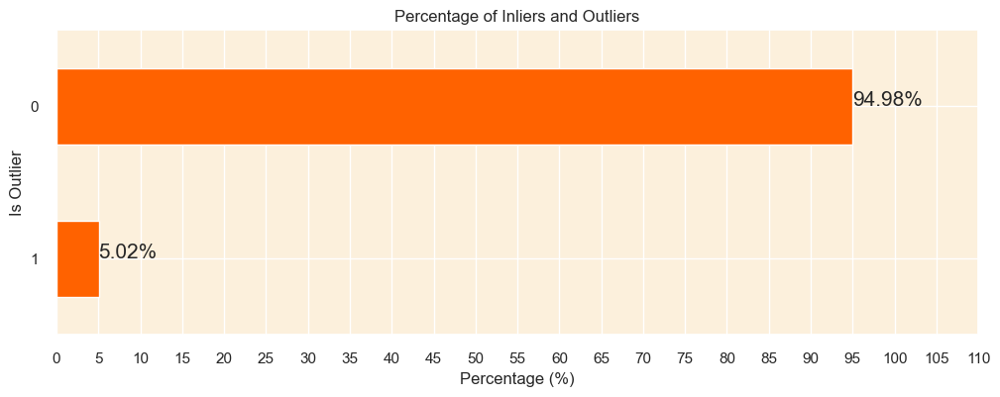

In [50]:
# Calculate the percentage of inliers and outliers
outlier_percentage = customer_data['Is_Outlier'].value_counts(normalize=True) * 100

# Plotting the percentage of inliers and outliers
plt.figure(figsize=(12, 4))
outlier_percentage.plot(kind='barh', color='#ff6200')

# Adding the percentage labels on the bars
for index, value in enumerate(outlier_percentage):
    plt.text(value, index, f'{value:.2f}%', fontsize=15)

plt.title('Percentage of Inliers and Outliers')
plt.xticks(ticks=np.arange(0, 115, 5))
plt.xlabel('Percentage (%)')
plt.ylabel('Is Outlier')
plt.gca().invert_yaxis()
plt.show()

In [51]:
# Separate the outliers for analysis
outliers_data = customer_data[customer_data['Is_Outlier'] == 1]

# Remove the outliers from the main dataset
customer_data_cleaned = customer_data[customer_data['Is_Outlier'] == 0]

# Drop the 'Outlier_Scores' and 'Is_Outlier' columns
customer_data_cleaned = customer_data_cleaned.drop(columns=['Outlier_Scores', 'Is_Outlier'])

# Reset the index of the cleaned data
customer_data_cleaned.reset_index(drop=True, inplace=True)

In [52]:
# Getting the number of rows in the cleaned customer dataset
customer_data_cleaned.shape[0]

4067

Cleaned Customer Data

In [53]:
customer_data_cleaned.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,12346.0,325,2,0,0.0,0.0,1,0.0,1,10,1,1,0.5,0.0,0.0,0.0
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,1,14,0,0,0.0,615.714286,341.070789,4.486071
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,3,19,0,0,0.0,359.31,203.875689,-100.884
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,9,0,0,0.0,1457.55,0.0,0.0
4,12350.0,310,1,196,294.4,294.4,16,0.0,2,16,0,0,0.0,294.4,0.0,0.0


Correlation Analysis

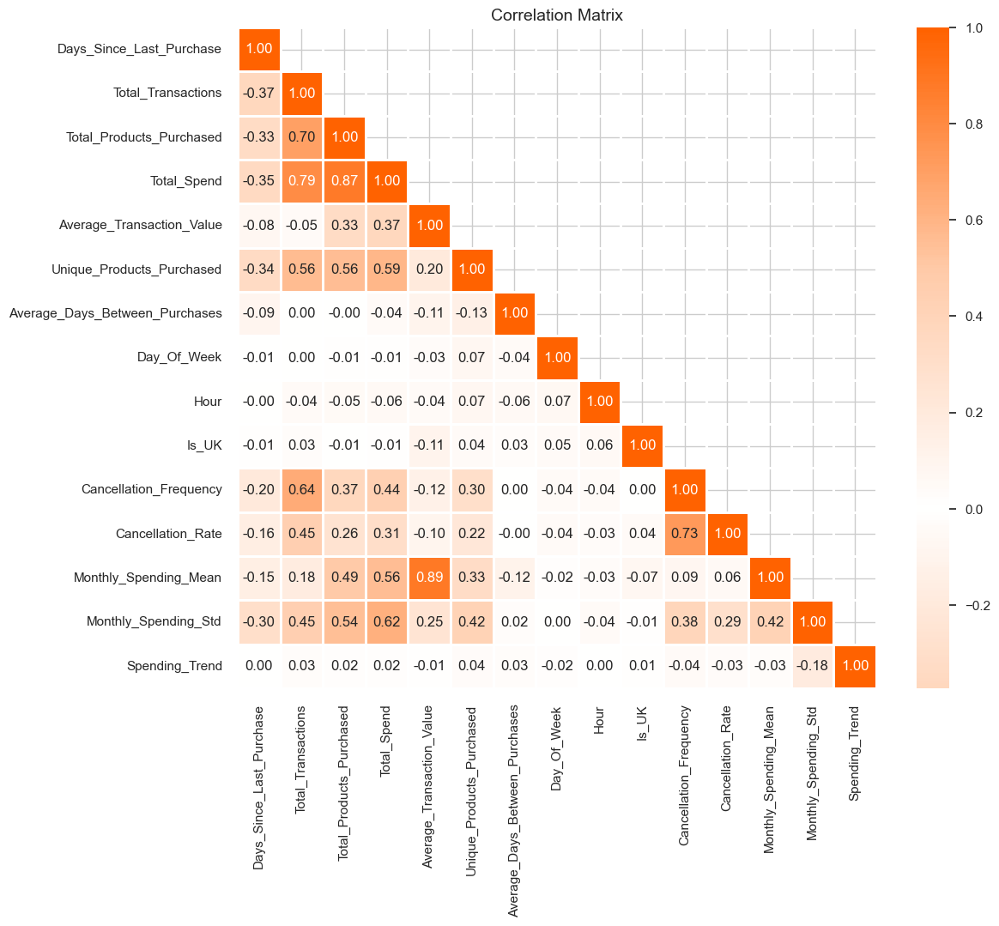

In [54]:
# Reset background style
sns.set_style('whitegrid')

# Calculate the correlation matrix excluding the 'CustomerID' column
corr = customer_data_cleaned.drop(columns=['CustomerID']).corr()

# Define a custom colormap
colors = ['#ff6200', '#ffcaa8', 'white', '#ffcaa8', '#ff6200']
my_cmap = LinearSegmentedColormap.from_list('custom_map', colors, N=256)

# Create a mask to only show the lower triangle of the matrix (since it's mirrored around its 
# top-left to bottom-right diagonal)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap=my_cmap, annot=True, center=0, fmt='.2f', linewidths=2)
plt.title('Correlation Matrix', fontsize=14)
plt.show()

Feature Scaling

In [55]:
# Initialize the StandardScaler
scaler = StandardScaler()

# List of columns that don't need to be scaled
columns_to_exclude = ['CustomerID', 'Is_UK', 'Day_Of_Week']

# List of columns that need to be scaled
columns_to_scale = customer_data_cleaned.columns.difference(columns_to_exclude)

# Copy the cleaned dataset
customer_data_scaled = customer_data_cleaned.copy()

# Applying the scaler to the necessary columns in the dataset
customer_data_scaled[columns_to_scale] = scaler.fit_transform(customer_data_scaled[columns_to_scale])

# Display the first few rows of the scaled data
customer_data_scaled.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,12346.0,2.345802,-0.477589,-0.754491,-0.813464,-1.317106,-0.908471,-0.310564,1,-1.086929,1,0.420541,0.417623,-1.329018,-0.713318,0.090868
1,12347.0,-0.905575,0.707930,2.005048,2.366920,1.528132,0.815119,-0.128438,1,0.647126,0,-0.545753,-0.432111,0.989511,1.259961,0.116774
2,12348.0,-0.170744,-0.003381,1.863591,0.247087,0.343279,-0.570512,0.672476,3,2.814696,0,-0.545753,-0.432111,0.023997,0.466213,-0.491708
3,12349.0,-0.744516,-0.714692,-0.047205,0.262074,5.418285,0.291283,-0.310564,0,-1.520443,0,-0.545753,-0.432111,4.159521,-0.713318,0.090868
4,12350.0,2.194809,-0.714692,-0.534446,-0.596223,0.043327,-0.655002,-0.310564,2,1.514154,0,-0.545753,-0.432111,-0.220428,-0.713318,0.090868


Dimensionality Reduction

In [56]:
# Setting CustomerID as the index column
customer_data_scaled.set_index('CustomerID', inplace=True)

# Apply PCA
pca = PCA().fit(customer_data_scaled)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Set the optimal k value (based on our analysis, we can choose 6)
optimal_k = 6

# Set seaborn plot style
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')

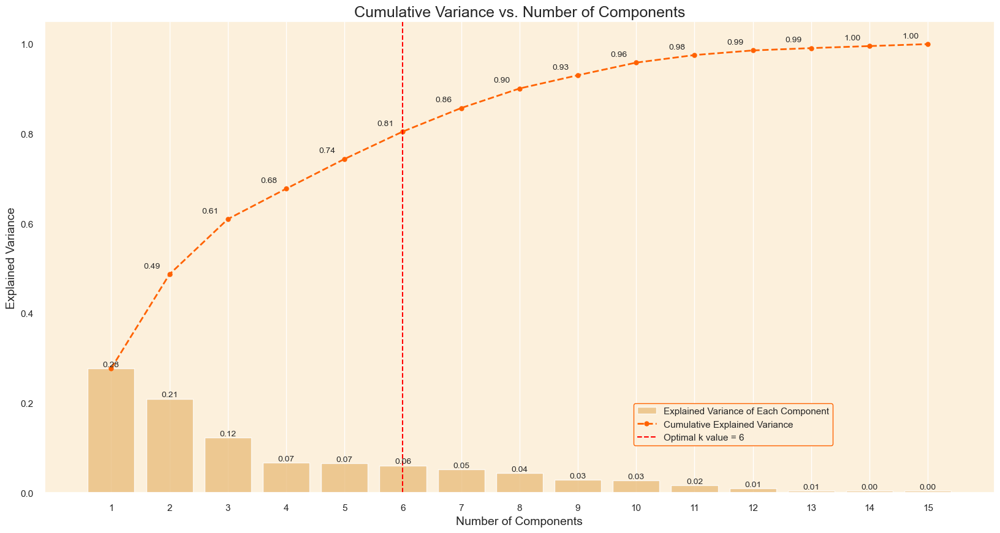

In [57]:
# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(20, 10))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      color='#fcc36d',
                      alpha=0.8)

# Line plot for the cumulative explained variance
lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance,
                     marker='o', linestyle='--', color='#ff6200', linewidth=2)

# Plot optimal k value line
optimal_k_line = plt.axvline(optimal_k - 1, color='red', linestyle='--', label=f'Optimal k value = {optimal_k}') 

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize ticks and legend
plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, optimal_k_line],
           labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Optimal k value = {optimal_k}'],
           loc=(0.62, 0.1),
           frameon=True,
           framealpha=1.0,  
           edgecolor='#ff6200')  

# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')   
plt.show()

Method 1

PCA

In [58]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
customer_data_pca = pca.fit_transform(customer_data_scaled)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the CustomerID index back to the new PCA dataframe
customer_data_pca.index = customer_data_scaled.index

In [59]:
# Displaying the resulting dataframe based on the PCs
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
12346.0,-2.186469,-1.705370,-1.576745,1.008187,-0.411803,-1.658012
12347.0,3.290264,-1.387375,1.923310,-0.930990,-0.010591,0.873150
12348.0,0.584684,0.585019,0.664727,-0.655411,-0.470280,2.306657
12349.0,1.791116,-2.695652,5.850040,0.853418,0.677111,-1.520098
12350.0,-1.997139,-0.542639,0.578781,0.183682,-1.484838,0.062672


In [60]:
# Define a function to highlight the top 3 absolute values in each column of a dataframe
def highlight_top3(column):
    top3 = column.abs().nlargest(3).index
    return ['background-color:  #ffeacc' if i in top3 else '' for i in column.index]

# Create the PCA component DataFrame and apply the highlighting function
pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],  
                     index=customer_data_scaled.columns)

pc_df.style.apply(highlight_top3, axis=0)

,PC1,PC2,PC3,PC4,PC5,PC6
Days_Since_Last_Purchase,-0.217859,-0.013986,0.067660,0.273430,-0.240968,-0.373059
Total_Transactions,0.380301,0.014759,-0.259180,-0.138165,-0.017356,-0.028257
Total_Products_Purchased,0.401425,0.007365,0.069133,-0.134806,0.057476,-0.013373
Total_Spend,0.431260,0.010159,0.065165,-0.092047,0.025202,-0.036947
Average_Transaction_Value,0.176225,-0.015544,0.589050,0.114307,0.021847,-0.101738
Unique_Products_Purchased,0.324992,0.063346,0.014010,-0.230502,-0.193981,0.124604
Average_Days_Between_Purchases,-0.022600,-0.036007,-0.127341,-0.160627,0.753462,0.211787
Day_Of_Week,-0.026572,0.994650,-0.006591,0.028870,0.058359,-0.060799
Hour,-0.024259,0.056388,-0.002019,-0.226832,-0.528881,0.621915
Is_UK,-0.001014,0.007435,-0.018378,-0.013419,-0.005353,0.014384


Method 2

Kernel PCA for Dimensionality Reduction

In [61]:
from sklearn.decomposition import KernelPCA
import pandas as pd
# Step 2: Implement Kernel PCA
kpca = KernelPCA(n_components=10, kernel='rbf')  # Adjust n_components as needed
customer_data_kpca = kpca.fit_transform(customer_data_scaled)

# Note: kernel='rbf' is for Radial Basis Function kernel. You can choose other kernels like 'linear', 'poly', 'sigmoid', etc.

# Optional: Convert the transformed data back to a DataFrame for further analysis
customer_data_kpca = pd.DataFrame(customer_data_kpca, columns=[f'PC{i+1}' for i in range(customer_data_kpca.shape[1])])

# Now customer_data_kpca contains the transformed data with reduced dimensions


In [62]:
customer_data_kpca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-0.241134,-0.054353,0.491934,-0.177236,-0.211124,0.137450,0.109559,-0.078437,0.161668,-0.049587
1,0.067134,0.501130,-0.028401,0.057192,0.218989,0.046111,0.041101,-0.158713,-0.286167,0.153837
2,0.120761,0.140775,-0.065386,0.338616,0.112841,0.085060,-0.073593,-0.052889,0.040371,0.088935
3,0.138649,0.354059,0.213130,0.015359,0.066831,-0.138261,-0.258223,-0.019520,-0.043492,-0.039525
4,-0.153416,-0.224805,0.425400,0.319799,0.176480,0.176726,0.068914,-0.018042,0.051497,-0.031865


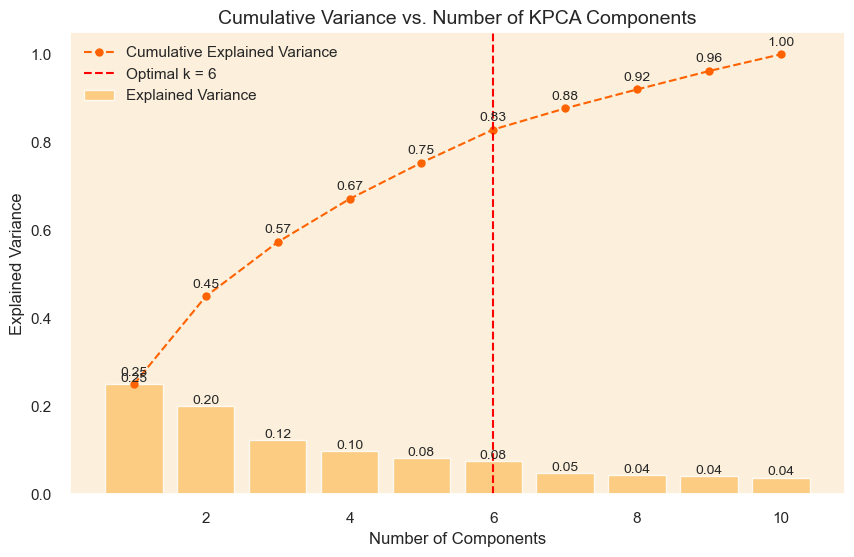

Optimal number of components: 6


In [63]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Compute the variance of each KPCA component
component_variance = np.var(customer_data_kpca, axis=0)

# Step 2: Compute the explained variance ratio (proxy)
explained_variance_ratio = component_variance / np.sum(component_variance)

# Step 3: Compute the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Step 4: Select optimal k where cumulative variance reaches ~80%
optimal_k = np.argmax(cumulative_explained_variance >= 0.80) + 1

# Step 5: Plot cumulative explained variance
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')
plt.figure(figsize=(10, 6))

# Bar plot for each component’s explained variance
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.8, color='#fcc36d', label='Explained Variance')

# Line plot for cumulative explained variance
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--', color='#ff6200', label='Cumulative Explained Variance')

# Mark optimal k
plt.axvline(optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')

# Labels and title
plt.xlabel("Number of Components", fontsize=12)
plt.ylabel("Explained Variance", fontsize=12)
plt.title("Cumulative Variance vs. Number of KPCA Components", fontsize=14)

# Annotate variance values
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i + 1, ev_ratio + 0.005, f"{ev_ratio:.2f}", ha="center", fontsize=10)
    plt.text(i + 1, cum_ev_ratio + 0.02, f"{cum_ev_ratio:.2f}", ha="center", fontsize=10)

plt.legend()
plt.grid(axis='both')
plt.show()

# Print optimal k
print(f"Optimal number of components: {optimal_k}")


In [64]:
# Implement Kernel PCA
kpca = KernelPCA(n_components=6, kernel='rbf')  
customer_data_kpca = kpca.fit_transform(customer_data_scaled)

# Note: kernel='rbf' is for Radial Basis Function kernel. You can choose other kernels like 'linear', 'poly', 'sigmoid', etc.

# Optional: Convert the transformed data back to a DataFrame for further analysis
customer_data_kpca = pd.DataFrame(customer_data_kpca, columns=[f'PC{i+1}' for i in range(customer_data_kpca.shape[1])])
# Adding the CustomerID index back to the new KPCA dataframe
customer_data_kpca.index = customer_data_scaled.index

In [65]:
customer_data_kpca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
12346.0,-0.241134,-0.054353,0.491934,-0.177236,-0.211124,0.137450
12347.0,0.067134,0.501130,-0.028401,0.057192,0.218989,0.046111
12348.0,0.120761,0.140775,-0.065386,0.338616,0.112841,0.085060
12349.0,0.138649,0.354059,0.213130,0.015359,0.066831,-0.138261
12350.0,-0.153416,-0.224805,0.425400,0.319799,0.176480,0.176726


Method 3

t-distribution stochastic neighbor embedding for Dimensionality Reduction

t-SNE

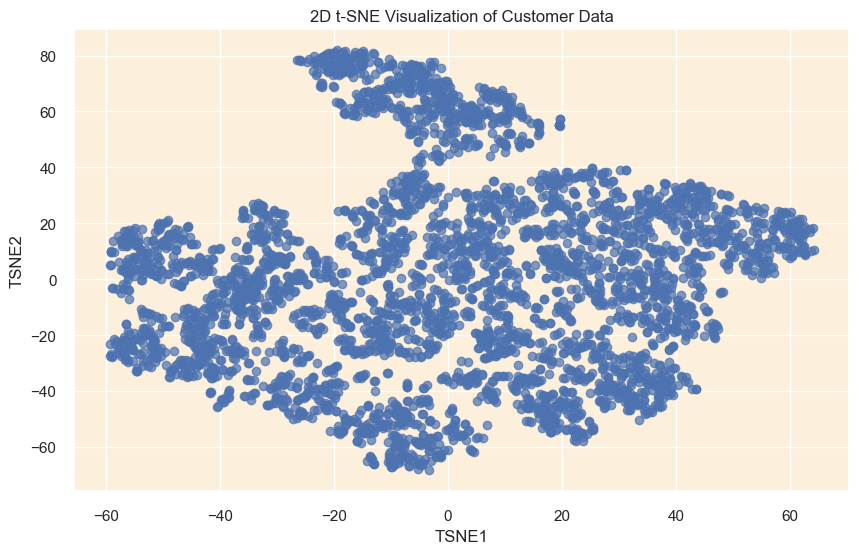

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

# Assuming customer_data_scaled is already preprocessed

# 2D t-SNE Visualization
tsne_2d = TSNE(n_components=2, random_state=0, perplexity=35, learning_rate=200)
customer_data_tsne_2d = tsne_2d.fit_transform(customer_data_scaled)
tsne_df_2d = pd.DataFrame(customer_data_tsne_2d, columns=['TSNE1', 'TSNE2'])

plt.figure(figsize=(10, 6))
plt.scatter(tsne_df_2d['TSNE1'], tsne_df_2d['TSNE2'], alpha=0.7, cmap='viridis')
plt.xlabel('TSNE1')
plt.ylabel('TSNE2')
plt.title('2D t-SNE Visualization of Customer Data')
plt.show()


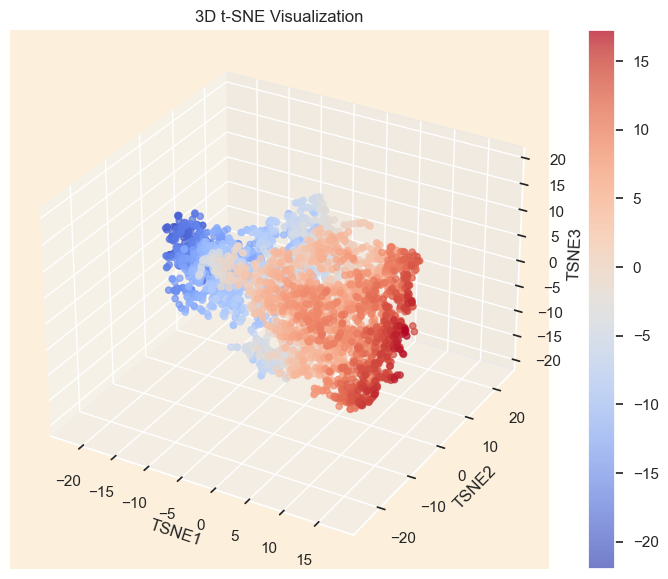

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

# Assuming customer_data_scaled is a pandas DataFrame or NumPy array
# Define t-SNE model with 3 components
tsne_model = TSNE(n_components=3, random_state=0, perplexity=30, learning_rate=200, init='random')

# Fit and transform the data
customer_data_tsne = tsne_model.fit_transform(customer_data_scaled)

# Convert to DataFrame (Optional)
customer_data_tsne_df = pd.DataFrame(customer_data_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(customer_data_tsne[:, 0], 
                customer_data_tsne[:, 1], 
                customer_data_tsne[:, 2], 
                c=customer_data_tsne[:, 0],  # Coloring based on TSNE1
                cmap='coolwarm', 
                alpha=0.7)

# Labels and title
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE2')
ax.set_zlabel('TSNE3')
ax.set_title('3D t-SNE Visualization')

# Show color legend
plt.colorbar(sc)

# Show plot
plt.show()


In [68]:
# Adding the CustomerID index back to the new tsne dataframe
customer_data_tsne_df.index = customer_data_scaled.index
customer_data_tsne_df.head()

,TSNE1,TSNE2,TSNE3
CustomerID,,,
12346.0,-11.008183,18.414433,-4.691806
12347.0,9.984974,0.326322,5.159314
12348.0,-3.094053,-7.518928,-0.325464
12349.0,-3.593789,12.375984,9.168451
12350.0,-11.991344,6.761514,0.006471


Method 4

UMAP

Uniform Manifold Approximation and Projection

In [69]:
pip install umap-learn

Note: you may need to restart the kernel to use updated packages.


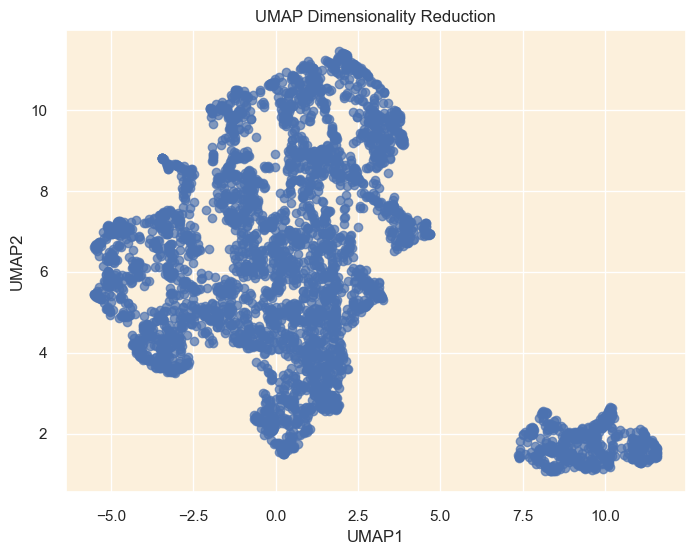

In [70]:
import umap
import matplotlib.pyplot as plt
import pandas as pd

# Assuming customer_data_scaled is a pandas DataFrame or NumPy array
# Define UMAP model
umap_model = umap.UMAP(n_components=2, random_state=0)

# Fit and transform the data
customer_data_umap = umap_model.fit_transform(customer_data_scaled)

# Convert to DataFrame (Optional)
customer_data_umap_df = pd.DataFrame(customer_data_umap, columns=['UMAP1', 'UMAP2'])

# Plot the reduced dimensions
plt.figure(figsize=(8, 6))
plt.scatter(customer_data_umap[:, 0], customer_data_umap[:, 1], cmap='viridis', alpha=0.7)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP Dimensionality Reduction')
plt.show()


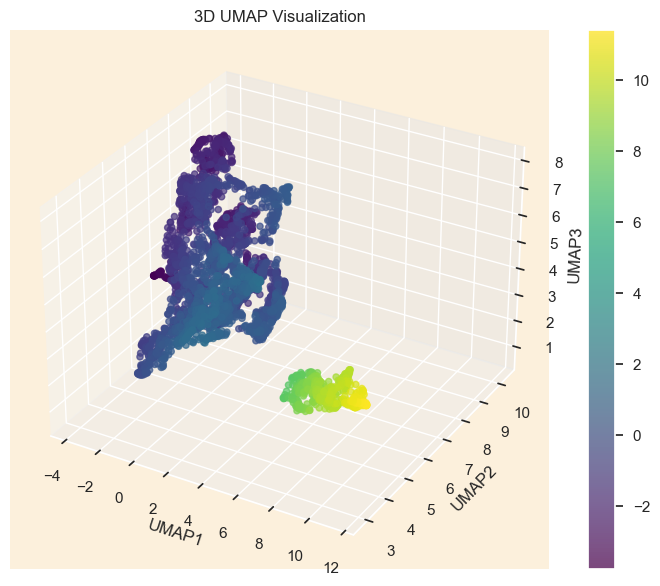

In [71]:
import umap
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

# Assuming customer_data_scaled is a pandas DataFrame or NumPy array
# Define UMAP model with 3 components
umap_model = umap.UMAP(n_components=3, random_state=0)

# Fit and transform the data
customer_data_umap = umap_model.fit_transform(customer_data_scaled)

# Convert to DataFrame (Optional)
customer_data_umap_df = pd.DataFrame(customer_data_umap, columns=['UMAP1', 'UMAP2', 'UMAP3'])

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(customer_data_umap[:, 0], 
                customer_data_umap[:, 1], 
                customer_data_umap[:, 2], 
                c=customer_data_umap[:, 0],  # Coloring based on UMAP1
                cmap='viridis', 
                alpha=0.7)

# Labels and title
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_zlabel('UMAP3')
ax.set_title('3D UMAP Visualization')

# Show plot
plt.colorbar(sc)
plt.show()


In [72]:
# Adding the CustomerID index back to the new tsne dataframe
customer_data_umap_df.index = customer_data_scaled.index
customer_data_umap_df.head()

,UMAP1,UMAP2,UMAP3
CustomerID,,,
12346.0,-2.650277,8.831013,7.521433
12347.0,1.073991,5.162761,4.552852
12348.0,-0.744249,6.973812,1.911965
12349.0,0.530775,9.107960,5.933802
12350.0,-2.679150,9.487876,4.364488


K-Means Clustering

Using PCA Technique

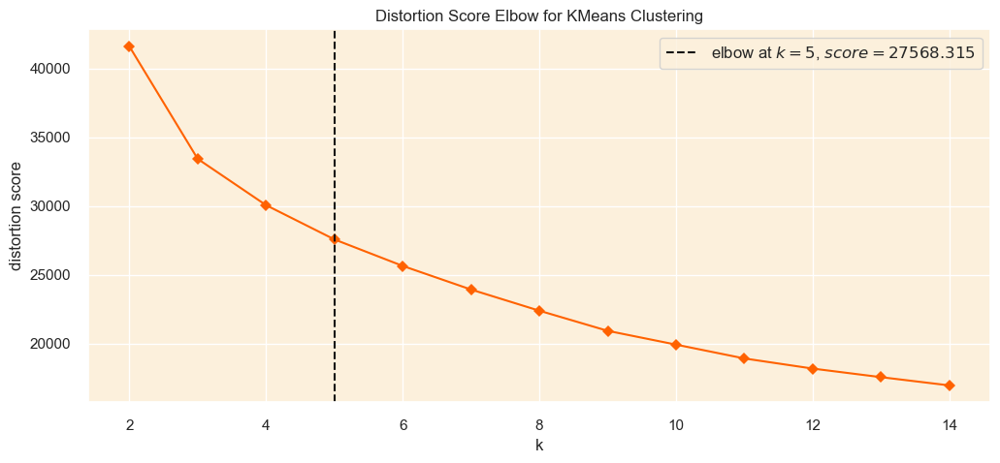

In [73]:
# Set plot style, and background color
sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

# Set the color palette for the plot
sns.set_palette(['#ff6200'])

# Instantiate the clustering model with the specified parameters
km = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=0)

# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(12, 5))

# Instantiate the KElbowVisualizer with the model and range of k values, and disable the timing plot
visualizer = KElbowVisualizer(km, k=(2, 15), timings=False, ax=ax)

# Fit the data to the visualizer
visualizer.fit(customer_data_pca)

# Finalize and render the figure
visualizer.show();

Silhouette Method

In [74]:
def silhouette_analysis(df, start_k, stop_k, figsize=(15, 16)):
    """
    Perform Silhouette analysis for a range of k values and visualize the results.
    """

    # Set the size of the figure
    plt.figure(figsize=figsize)

    # Create a grid with (stop_k - start_k + 1) rows and 2 columns
    grid = gridspec.GridSpec(stop_k - start_k + 1, 2)

    # Assign the first plot to the first row and both columns
    first_plot = plt.subplot(grid[0, :])

    # First plot: Silhouette scores for different k values
    sns.set_palette(['darkorange'])

    silhouette_scores = []
# Iterate through the range of k values
    for k in range(start_k, stop_k + 1):
        km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=0)
        km.fit(df)
        labels = km.predict(df)
        score = silhouette_score(df, labels)
        silhouette_scores.append(score)

    best_k = start_k + silhouette_scores.index(max(silhouette_scores))

    plt.plot(range(start_k, stop_k + 1), silhouette_scores, marker='o')
    plt.xticks(range(start_k, stop_k + 1))
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette score')
    plt.title('Average Silhouette Score for Different k Values', fontsize=15)

    # Add the optimal k value text to the plot
    optimal_k_text = f'The k value with the highest Silhouette score is: {best_k}'
    plt.text(10, 0.23, optimal_k_text, fontsize=12, verticalalignment='bottom', 
             horizontalalignment='left', bbox=dict(facecolor='#fcc36d', edgecolor='#ff6200', boxstyle='round, pad=0.5'))
     # Second plot (subplot): Silhouette plots for each k value
    colors = sns.color_palette("bright")

    for i in range(start_k, stop_k + 1):    
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
        row_idx, col_idx = divmod(i - start_k, 2)

        # Assign the plots to the second, third, and fourth rows
        ax = plt.subplot(grid[row_idx + 1, col_idx])

        visualizer = SilhouetteVisualizer(km, colors=colors, ax=ax)
        visualizer.fit(df)

        # Add the Silhouette score text to the plot
        score = silhouette_score(df, km.labels_)
        ax.text(0.97, 0.02, f'Silhouette Score: {score:.2f}', fontsize=12, \
                ha='right', transform=ax.transAxes, color='red')

        ax.set_title(f'Silhouette Plot for {i} Clusters', fontsize=15)

    plt.tight_layout()
    plt.show()

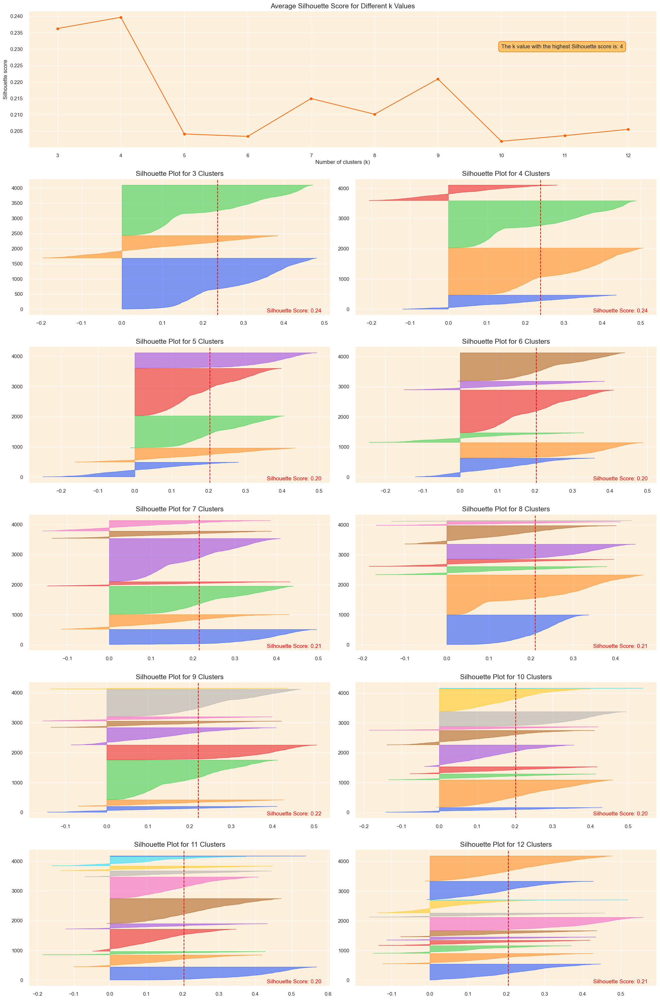

In [75]:
silhouette_analysis(customer_data_pca, 3, 12, figsize=(20, 50))

Until we were deciding the optimal value of k for Kmeans Clustering Algorithm using the df dataframe

Now, Apply KMeans clustering using the optimal k

In [76]:
# Apply KMeans clustering using the optimal k
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=10, max_iter=100, random_state=0)
kmeans.fit(customer_data_pca)

# Get the frequency of each cluster
cluster_frequencies = Counter(kmeans.labels_)

# Create a mapping from old labels to new labels based on frequency
label_mapping = {label: new_label for new_label, (label, _) in 
                 enumerate(cluster_frequencies.most_common())}

# Reverse the mapping to assign labels as per your criteria
label_mapping = {v: k for k, v in {2: 1, 1: 0, 0: 2}.items()}

# Apply the mapping to get the new labels
new_labels = np.array([label_mapping[label] for label in kmeans.labels_])

# Append the new cluster labels back to the original dataset
customer_data_cleaned['cluster'] = new_labels

# Append the new cluster labels to the PCA version of the dataset
customer_data_pca['cluster'] = new_labels

Clustering Evaluation

In [77]:
# Setting up the color scheme for the clusters (RGB order)
colors = ['#e8000b', '#1ac938', '#023eff']

In [78]:
# Create separate data frames for each cluster
cluster_0 = customer_data_pca[customer_data_pca['cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['cluster'] == 1]
cluster_2 = customer_data_pca[customer_data_pca['cluster'] == 2]

# Create a 3D scatter plot
fig = go.Figure()

# Add data points for each cluster separately and specify the color
fig.add_trace(go.Scatter3d(x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'], 
                           mode='markers', marker=dict(color=colors[0], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'], 
                           mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 1'))
fig.add_trace(go.Scatter3d(x=cluster_2['PC1'], y=cluster_2['PC2'], z=cluster_2['PC3'], 
                           mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 2'))
# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()

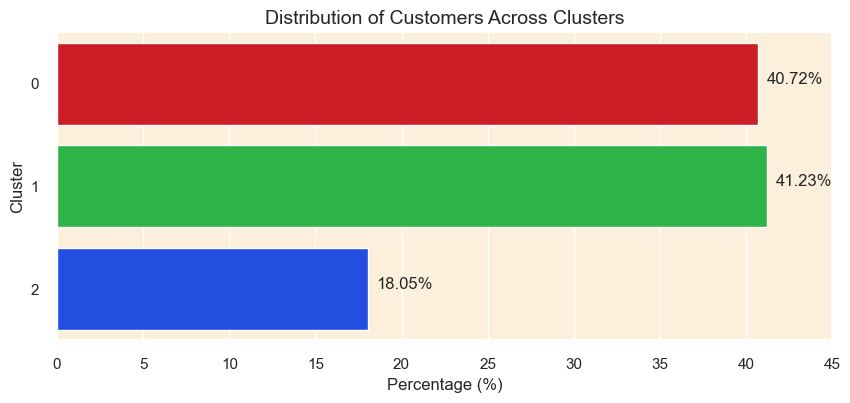

In [79]:
# Calculate the percentage of customers in each cluster
cluster_percentage = (customer_data_pca['cluster'].value_counts(normalize=True) * 100).reset_index()
cluster_percentage.columns = ['Cluster', 'Percentage']
cluster_percentage.sort_values(by='Cluster', inplace=True)

# Create a horizontal bar plot
plt.figure(figsize=(10, 4))
sns.barplot(x='Percentage', y='Cluster', data=cluster_percentage, orient='h', palette=colors)

# Adding percentages on the bars
for index, value in enumerate(cluster_percentage['Percentage']):
    plt.text(value+0.5, index, f'{value:.2f}%')

plt.title('Distribution of Customers Across Clusters', fontsize=14)
plt.xticks(ticks=np.arange(0, 50, 5))
plt.xlabel('Percentage (%)')

# Show the plot
plt.show()

Checking 2D Representation

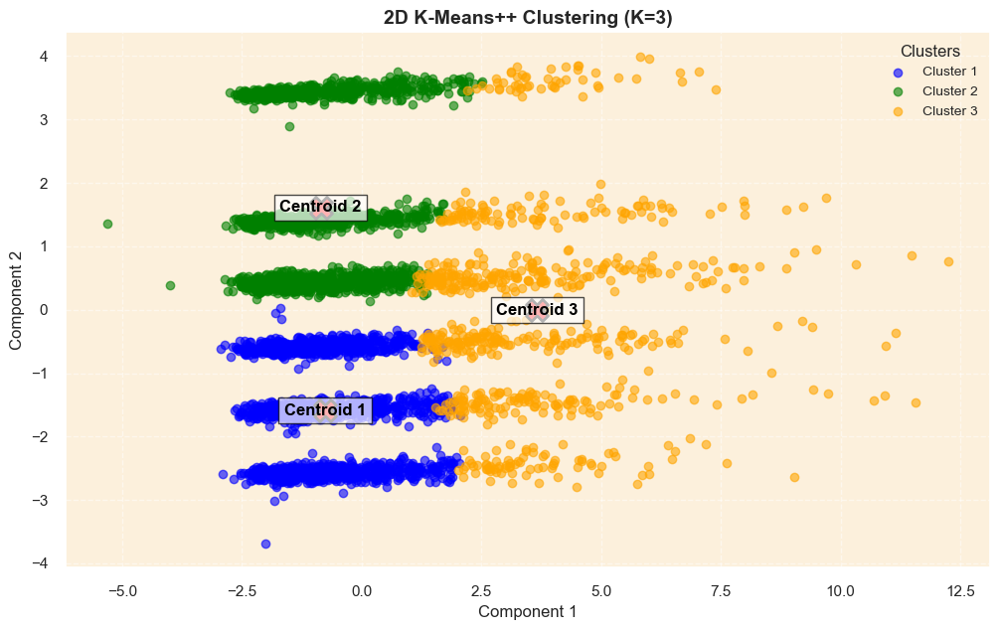

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Convert the dataframe to a NumPy array
X = customer_data_pca.to_numpy()

# Apply K-Means++ clustering with K=3
k = 3
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3"}
colors = ['blue', 'green', 'orange']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Plot centroids with labels
for i, centroid in enumerate(centroids):
    plt.scatter(centroid[0], centroid[1], color='red', marker='X', s=250, edgecolors='black', linewidth=2)
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', fontsize=12, fontweight='bold', color='black', 
             ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))

# Label axes
plt.title("2D K-Means++ Clustering (K=3)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


Radar Chart Based on 3D Plotting of K-Means Clustering Algorithm

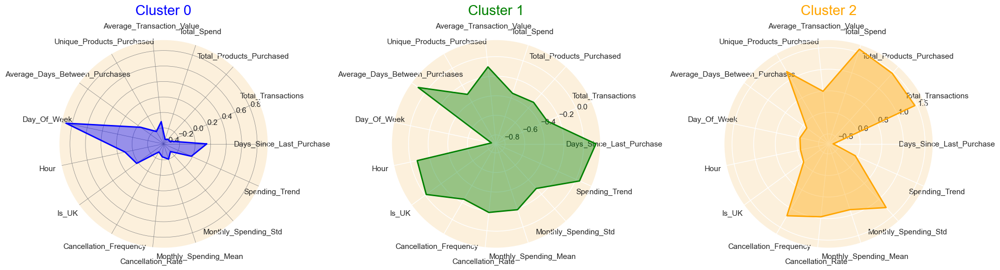

In [81]:
# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = customer_data_cleaned.set_index('CustomerID')

# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()
# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]
# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=3)

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])

ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])

ax[2].set_xticks(angles[:-1])
ax[2].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)
# Display the plot
plt.tight_layout()
plt.show()

In [82]:
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,cluster
CustomerID,,,,,,,
12346.0,-2.186469,-1.705370,-1.576745,1.008187,-0.411803,-1.658012,1
12347.0,3.290264,-1.387375,1.923310,-0.930990,-0.010591,0.873150,2
12348.0,0.584684,0.585019,0.664727,-0.655411,-0.470280,2.306657,0
12349.0,1.791116,-2.695652,5.850040,0.853418,0.677111,-1.520098,1
12350.0,-1.997139,-0.542639,0.578781,0.183682,-1.484838,0.062672,1


K Means using KPCA Technique

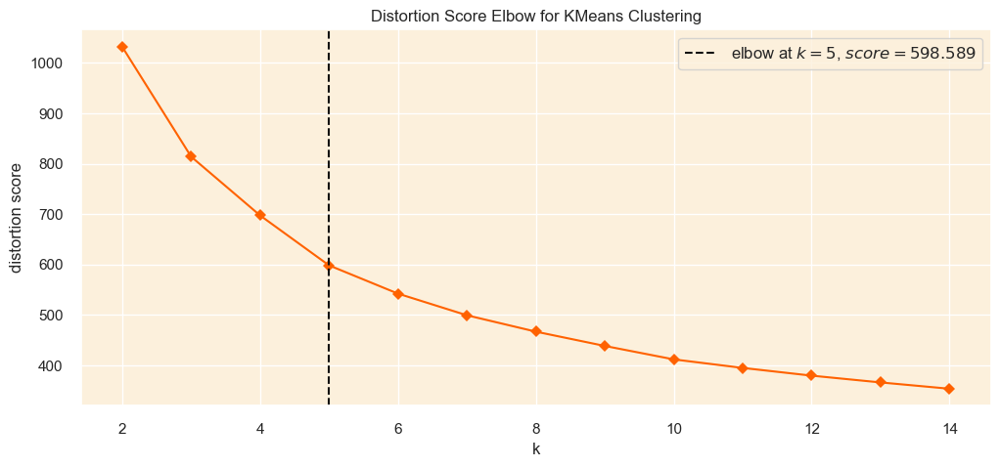

In [83]:
# Set plot style, and background color
sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

# Set the color palette for the plot
sns.set_palette(['#ff6200'])

# Instantiate the clustering model with the specified parameters
km = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=0)

# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(12, 5))

# Instantiate the KElbowVisualizer with the model and range of k values, and disable the timing plot
visualizer = KElbowVisualizer(km, k=(2, 15), timings=False, ax=ax)

# Fit the data to the visualizer
visualizer.fit(customer_data_kpca)

# Finalize and render the figure
visualizer.show();

In [84]:
silhouette_scores = []
cluster_range = range(2, 11)  # Testing from 2 to 10 clusters

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=0, n_init=10)
    cluster_labels = kmeans.fit_predict(customer_data_kpca)
    score = silhouette_score(customer_data_kpca, cluster_labels)
    print(f"K= {k}", f"silhouette_score is: {score}")
    silhouette_scores.append(score)

# Find the optimal number of clusters
optimal_clusters = cluster_range[np.argmax(silhouette_scores)]
print(f"Optimal number of clusters: {optimal_clusters}")

K= 2 silhouette_score is: 0.22152100837668293
K= 3 silhouette_score is: 0.2548834395397837
K= 4 silhouette_score is: 0.27120263925314364
K= 5 silhouette_score is: 0.2929705856319521
K= 6 silhouette_score is: 0.2990659014147285
K= 7 silhouette_score is: 0.2850504981643311
K= 8 silhouette_score is: 0.2802811001043565
K= 9 silhouette_score is: 0.27461130278865653
K= 10 silhouette_score is: 0.26811907292278897
Optimal number of clusters: 6


Based on Elbow and Silhouette score selecting K=5

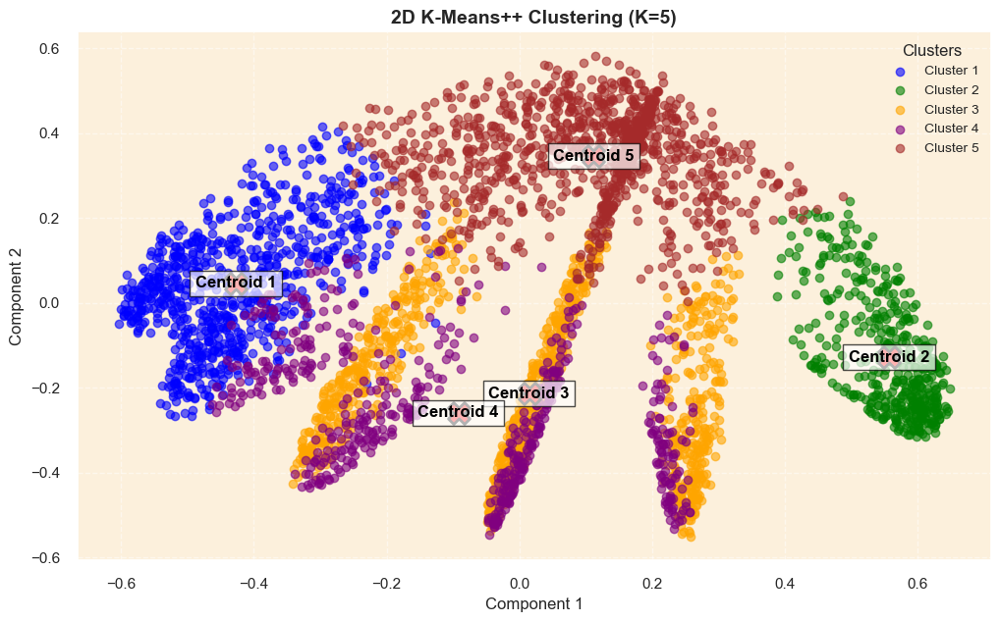

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Convert the dataframe to a NumPy array
X = customer_data_kpca.to_numpy()

# Apply K-Means++ clustering with K=5
k = 5
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3", 3: "Cluster 4", 4: "Cluster 5"}
colors = ['blue', 'green', 'orange', 'purple', 'brown']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Plot centroids with labels
for i, centroid in enumerate(centroids):
    plt.scatter(centroid[0], centroid[1], color='red', marker='X', s=250, edgecolors='black', linewidth=2)
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', fontsize=12, fontweight='bold', color='black', 
             ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))

# Label axes
plt.title("2D K-Means++ Clustering (K=5)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


K means Using t-SNE Technique

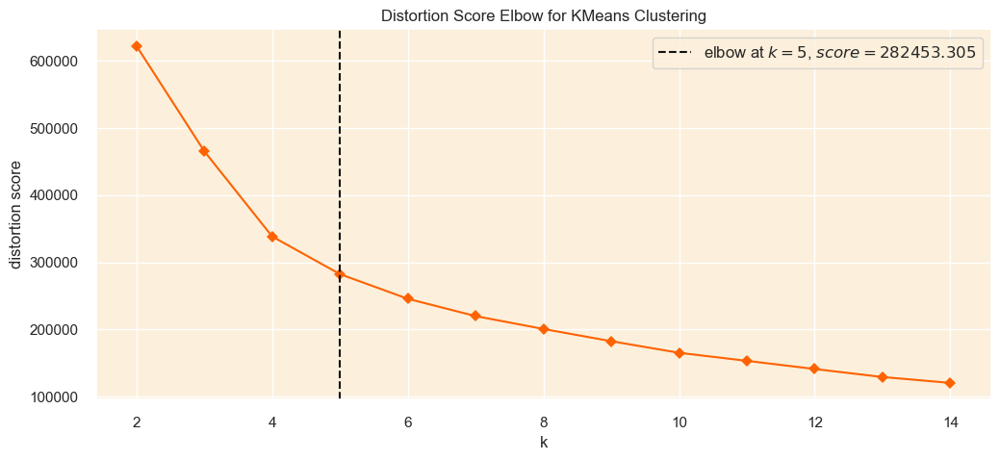

In [86]:
# Set plot style, and background color
sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

# Set the color palette for the plot
sns.set_palette(['#ff6200'])

# Instantiate the clustering model with the specified parameters
km = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=0)

# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(12, 5))

# Instantiate the KElbowVisualizer with the model and range of k values, and disable the timing plot
visualizer = KElbowVisualizer(km, k=(2, 15), timings=False, ax=ax)

# Fit the data to the visualizer
visualizer.fit(customer_data_tsne_df)

# Finalize and render the figure
visualizer.show();

In [87]:
silhouette_scores = []
cluster_range = range(2, 7)  # Testing from 2 to 6 clusters

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=0, n_init=10)
    cluster_labels = kmeans.fit_predict(customer_data_tsne_df)
    score = silhouette_score(customer_data_tsne_df, cluster_labels)
    print(f"K= {k}", f"silhouette_score is: {score}")
    silhouette_scores.append(score)

# Find the optimal number of clusters
optimal_clusters = cluster_range[np.argmax(silhouette_scores)]
print(f"Optimal number of clusters: {optimal_clusters}")

K= 2 silhouette_score is: 0.3116496801376343
K= 3 silhouette_score is: 0.30840441584587097
K= 4 silhouette_score is: 0.3472520411014557
K= 5 silhouette_score is: 0.3459111750125885
K= 6 silhouette_score is: 0.33829236030578613
Optimal number of clusters: 4


Based on Elbow Plot and Silhouette score selecting K=4

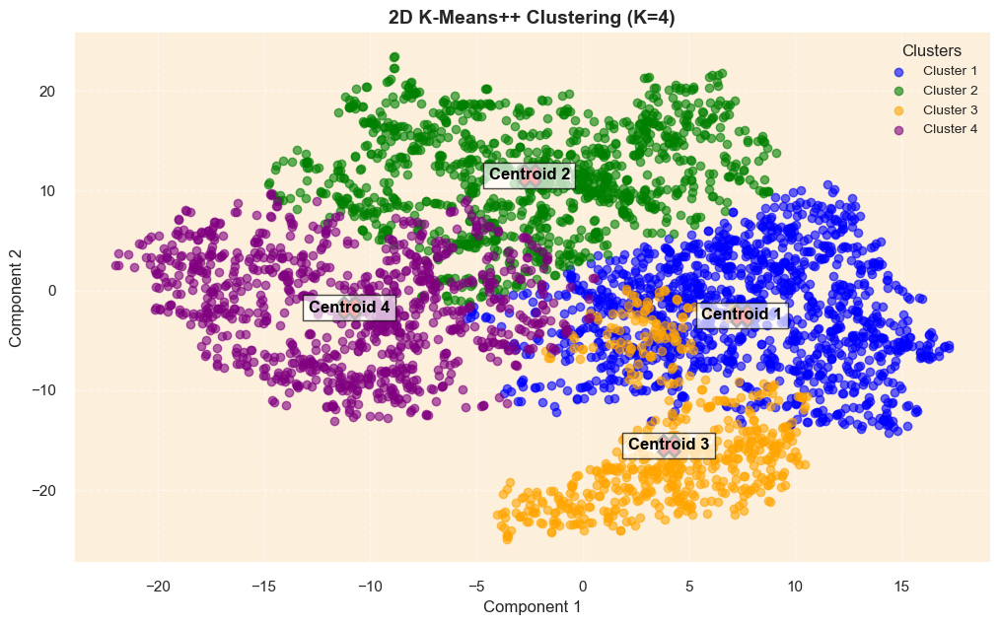

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Convert the dataframe to a NumPy array
X = customer_data_tsne_df.to_numpy()

# Apply K-Means++ clustering with K=4
k = 4
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3", 3: "Cluster 4"}
colors = ['blue', 'green', 'orange', 'purple']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Plot centroids with labels
for i, centroid in enumerate(centroids):
    plt.scatter(centroid[0], centroid[1], color='red', marker='X', s=250, edgecolors='black', linewidth=2)
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', fontsize=12, fontweight='bold', color='black', 
             ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))

# Label axes
plt.title("2D K-Means++ Clustering (K=4)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


K Means using UMAP Technique

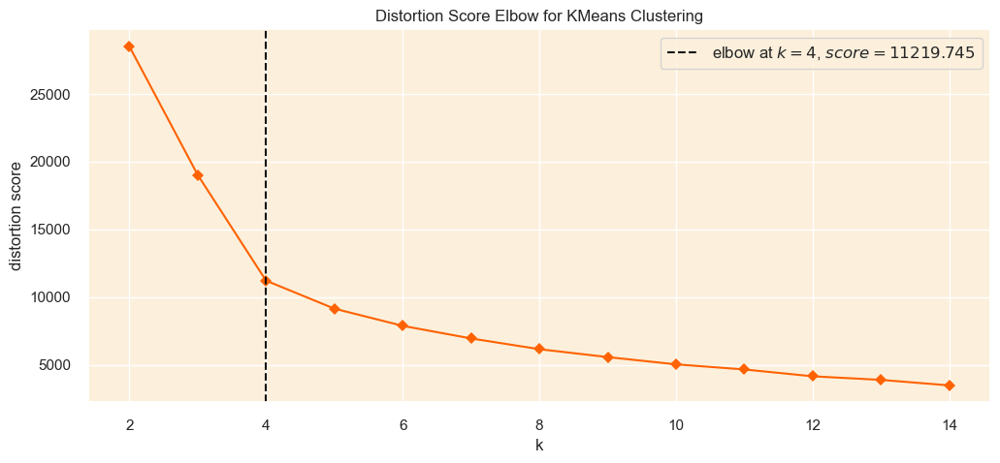

In [89]:
# Set plot style, and background color
sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

# Set the color palette for the plot
sns.set_palette(['#ff6200'])

# Instantiate the clustering model with the specified parameters
km = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=0)

# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(12, 5))

# Instantiate the KElbowVisualizer with the model and range of k values, and disable the timing plot
visualizer = KElbowVisualizer(km, k=(2, 15), timings=False, ax=ax)

# Fit the data to the visualizer
visualizer.fit(customer_data_umap_df)

# Finalize and render the figure
visualizer.show();

In [90]:
silhouette_scores = []
cluster_range = range(2, 7)  # Testing from 2 to 6 clusters

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=0, n_init=10)
    cluster_labels = kmeans.fit_predict(customer_data_umap_df)
    score = silhouette_score(customer_data_umap_df, cluster_labels)
    print(f"K= {k}", f"silhouette_score is: {score}")
    silhouette_scores.append(score)

# Find the optimal number of clusters
optimal_clusters = cluster_range[np.argmax(silhouette_scores)]
print(f"Optimal number of clusters: {optimal_clusters}")

K= 2 silhouette_score is: 0.688751220703125
K= 3 silhouette_score is: 0.3917234241962433
K= 4 silhouette_score is: 0.45954740047454834
K= 5 silhouette_score is: 0.4521937966346741
K= 6 silhouette_score is: 0.41201794147491455
Optimal number of clusters: 2


Based on Silhouette score selecting K=4

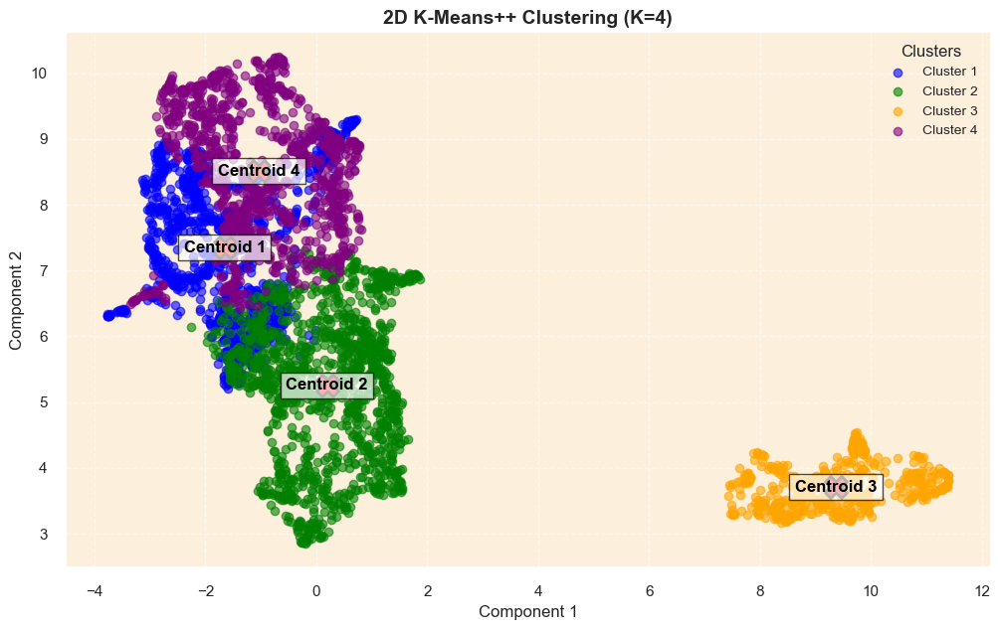

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Convert the dataframe to a NumPy array
X = customer_data_umap_df.to_numpy()

# Apply K-Means++ clustering with K=4
k = 4
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3", 3: "Cluster 4"}
colors = ['blue', 'green', 'orange', 'purple']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Plot centroids with labels
for i, centroid in enumerate(centroids):
    plt.scatter(centroid[0], centroid[1], color='red', marker='X', s=250, edgecolors='black', linewidth=2)
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', fontsize=12, fontweight='bold', color='black', 
             ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))

# Label axes
plt.title("2D K-Means++ Clustering (K=4)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


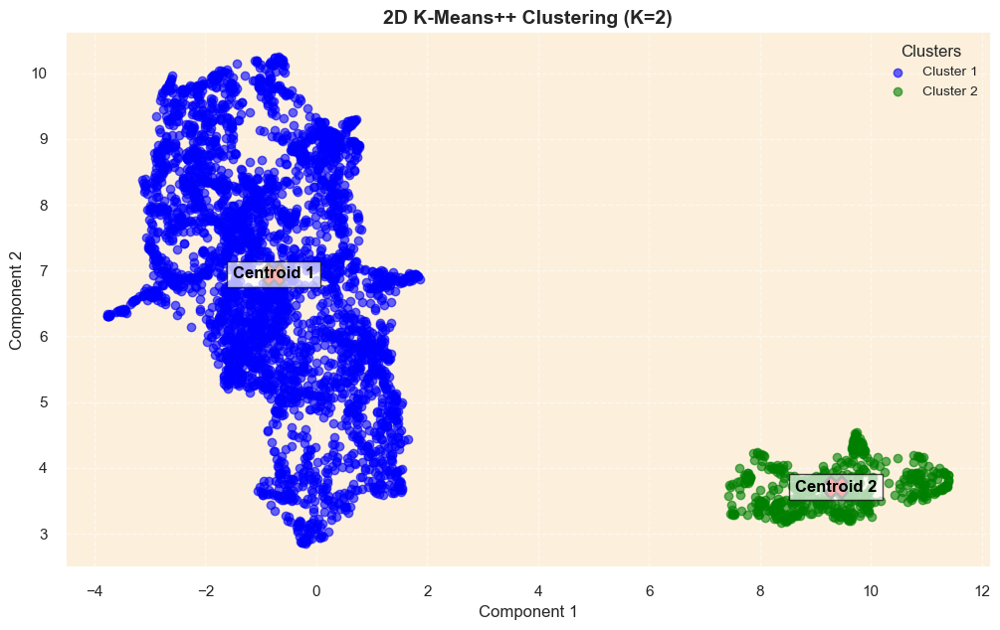

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Convert the dataframe to a NumPy array
X = customer_data_umap_df.to_numpy()

# Apply K-Means++ clustering with K=2
k = 2
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2"}
colors = ['blue', 'green']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Plot centroids with labels
for i, centroid in enumerate(centroids):
    plt.scatter(centroid[0], centroid[1], color='red', marker='X', s=250, edgecolors='black', linewidth=2)
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', fontsize=12, fontweight='bold', color='black', 
             ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))

# Label axes
plt.title("2D K-Means++ Clustering (K=2)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()

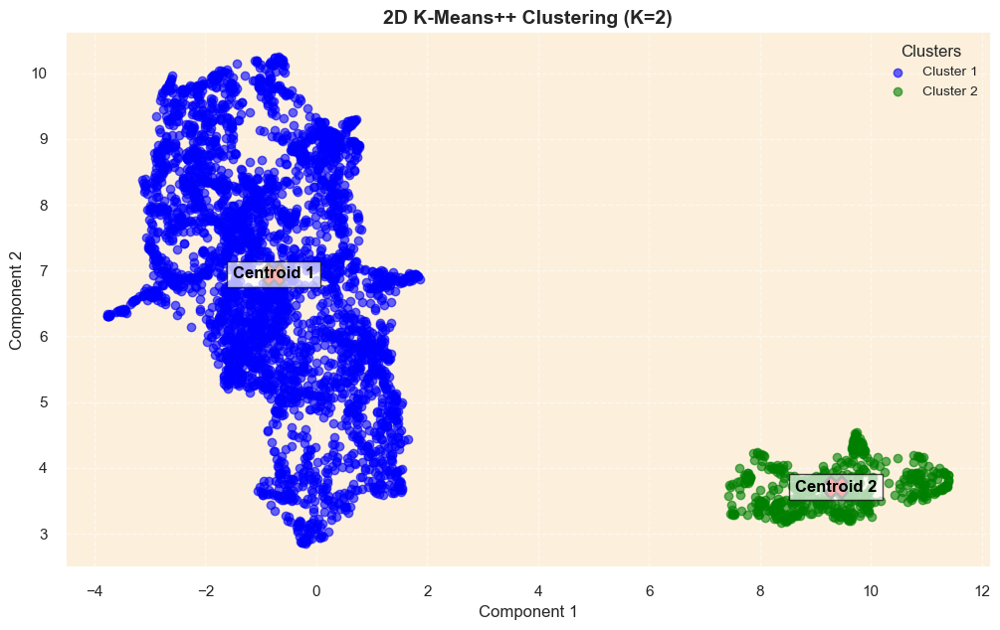

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,cluster
0,12346.0,325,2,0,0.0,0.0,1,0.0,1,10,1,1,0.5,0.0,0.0,0.0,0
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,1,14,0,0,0.0,615.714286,341.070789,4.486071,0
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,3,19,0,0,0.0,359.31,203.875689,-100.884,0
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,9,0,0,0.0,1457.55,0.0,0.0,0
4,12350.0,310,1,196,294.4,294.4,16,0.0,2,16,0,0,0.0,294.4,0.0,0.0,0


In [93]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Convert the dataframe to a NumPy array
X = customer_data_umap_df.to_numpy()

# Apply K-Means++ clustering with K=2
k = 2
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_

# Copy cluster labels to customer_data_cleaned
customer_data_cleaned["cluster"] = labels

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2"}
colors = ['blue', 'green']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Plot centroids with labels
for i, centroid in enumerate(centroids):
    plt.scatter(centroid[0], centroid[1], color='red', marker='X', s=250, edgecolors='black', linewidth=2)
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', fontsize=12, fontweight='bold', color='black', 
             ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))

# Label axes
plt.title("2D K-Means++ Clustering (K=2)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()

# Display the first few rows of the updated dataframe
customer_data_cleaned.head()


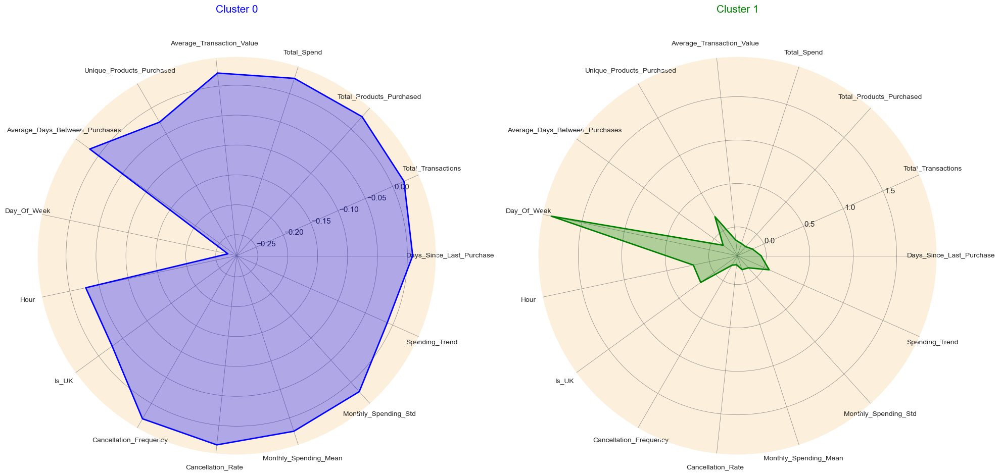

In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = customer_data_cleaned.set_index('CustomerID')

# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, 
                                        columns=df_customer.columns[:-1], 
                                        index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()

# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster_label):
    ax.fill(angles, data, color=color, alpha=0.3)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    ax.set_title(f'Cluster {cluster_label}', size=15, color=color, y=1.1)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels[:-1], fontsize=10)

# Set up radar chart data
labels = np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angles for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Complete the loop for a closed circular chart
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]

# Determine number of clusters dynamically
num_clusters = cluster_centroids.shape[0]
colors = ['blue', 'green', 'orange', 'purple', 'red'][:num_clusters]  # Adjust colors as needed

# Initialize the figure with an appropriate number of subplots
fig, axes = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=num_clusters)

# Ensure 'axes' is iterable even when num_clusters = 1
if num_clusters == 1:
    axes = [axes]

# Create radar chart for each cluster
for i, (ax, color) in enumerate(zip(axes, colors)):
    data = cluster_centroids.iloc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax, angles, data, color, i)

# Add a grid for clarity
for ax in axes:
    ax.grid(color='grey', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()

In [95]:
# Step 1: Extract the CustomerIDs of the outliers and remove their transactions from the main dataframe
outlier_customer_ids = outliers_data['CustomerID'].astype('float').unique()
df_filtered = df[~df['CustomerID'].isin(outlier_customer_ids)]

# Step 2: Ensure consistent data type for CustomerID across both dataframes before merging
customer_data_cleaned['CustomerID'] = customer_data_cleaned['CustomerID'].astype('float')

# Step 3: Merge the transaction data with the customer data to get the cluster information for each transaction
merged_data = df_filtered.merge(customer_data_cleaned[['CustomerID', 'cluster']], on='CustomerID', how='inner')

# Step 4: Identify the top 10 best-selling products in each cluster based on the total quantity sold
best_selling_products = merged_data.groupby(['cluster', 'StockCode', 'Description'])['Quantity'].sum().reset_index()
best_selling_products = best_selling_products.sort_values(by=['cluster', 'Quantity'], ascending=[True, False])
top_products_per_cluster = best_selling_products.groupby('cluster').head(10)
# Step 5: Create a record of products purchased by each customer in each cluster
customer_purchases = merged_data.groupby(['CustomerID', 'cluster', 'StockCode'])['Quantity'].sum().reset_index()

# Step 6: Generate recommendations for each customer in each cluster
recommendations = []
for cluster in top_products_per_cluster['cluster'].unique():
    top_products = top_products_per_cluster[top_products_per_cluster['cluster'] == cluster]
    customers_in_cluster = customer_data_cleaned[customer_data_cleaned['cluster'] == cluster]['CustomerID']
    
    for customer in customers_in_cluster:
        # Identify products already purchased by the customer
        customer_purchased_products = customer_purchases[(customer_purchases['CustomerID'] == customer) & 
                                                         (customer_purchases['cluster'] == cluster)]['StockCode'].tolist()
        
        # Find top 3 products in the best-selling list that the customer hasn't purchased yet
        top_products_not_purchased = top_products[~top_products['StockCode'].isin(customer_purchased_products)]
        top_3_products_not_purchased = top_products_not_purchased.head(3)
# Append the recommendations to the list
        recommendations.append([customer, cluster] + top_3_products_not_purchased[['StockCode', 'Description']].values.flatten().tolist())

# Step 7: Create a dataframe from the recommendations list and merge it with the original customer data
recommendations_df = pd.DataFrame(recommendations, columns=['CustomerID', 'cluster', 'Rec1_StockCode', 'Rec1_Description', \
                                                 'Rec2_StockCode', 'Rec2_Description', 'Rec3_StockCode', 'Rec3_Description'])
customer_data_with_recommendations = customer_data_cleaned.merge(recommendations_df, on=['CustomerID', 'cluster'], how='right')

In [96]:
# Display 10 random rows from the customer_data_with_recommendations dataframe
customer_data_with_recommendations.set_index('CustomerID').iloc[:, -6:].sample(10, random_state=0)

,Rec1_StockCode,Rec1_Description,Rec2_StockCode,Rec2_Description,Rec3_StockCode,Rec3_Description
CustomerID,,,,,,
13949.0,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,85099B,JUMBO BAG RED RETROSPOT,22616,PACK OF 12 LONDON TISSUES
13940.0,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,84879,ASSORTED COLOUR BIRD ORNAMENT,85099B,JUMBO BAG RED RETROSPOT
17521.0,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,85099B,JUMBO BAG RED RETROSPOT,22616,PACK OF 12 LONDON TISSUES
17507.0,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,84879,ASSORTED COLOUR BIRD ORNAMENT,85099B,JUMBO BAG RED RETROSPOT
16447.0,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,84879,ASSORTED COLOUR BIRD ORNAMENT,85099B,JUMBO BAG RED RETROSPOT
13229.0,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,84879,ASSORTED COLOUR BIRD ORNAMENT,85099B,JUMBO BAG RED RETROSPOT
14582.0,85123A,WHITE HANGING HEART T-LIGHT HOLDER,16045,POPART WOODEN PENCILS ASST,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS
14782.0,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS,84879,ASSORTED COLOUR BIRD ORNAMENT,85099B,JUMBO BAG RED RETROSPOT
17629.0,85123A,WHITE HANGING HEART T-LIGHT HOLDER,16045,POPART WOODEN PENCILS ASST,84077,WORLD WAR 2 GLIDERS ASSTD DESIGNS


Gaussian Mixture Model

Deciding the the optimal number of clusters for GMM 

In [97]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
customer_data_pca = pca.fit_transform(customer_data_scaled)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the CustomerID index back to the new PCA dataframe
customer_data_pca.index = customer_data_scaled.index
# Displaying the resulting dataframe based on the PCs
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
12346.0,-2.186469,-1.705370,-1.576745,1.008187,-0.411803,-1.658012
12347.0,3.290264,-1.387375,1.923310,-0.930990,-0.010591,0.873150
12348.0,0.584684,0.585019,0.664727,-0.655411,-0.470280,2.306657
12349.0,1.791116,-2.695652,5.850040,0.853418,0.677111,-1.520098
12350.0,-1.997139,-0.542639,0.578781,0.183682,-1.484838,0.062672


In [98]:
# Initialize Gaussian Mixture Model
gmm = GaussianMixture(n_components= 3 , random_state=0)
# Fit the model to the data
gmm.fit(customer_data_pca)
# Predict the cluster labels
clusters = gmm.predict(customer_data_pca)
# Evaluate the clustering performance 
silhouette_avg = silhouette_score(customer_data_pca, clusters)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.02965914982057579


For deciding the optimal number of clusters in GMM method the AIC and BIC scores are prefered

Using AIC and BIC Score Method

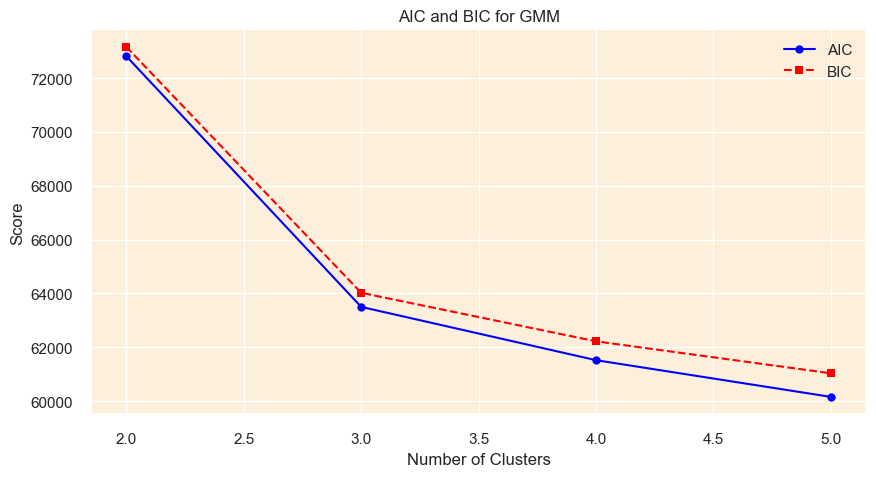

In [99]:
# Range of cluster numbers to test
# Testing from 2 to 6 clusters
n_components_range = range(2, 6)  
aic_scores = []
bic_scores = []

# Iterate over different cluster sizes
for n in n_components_range:
    gmm = GaussianMixture(n_components=n, random_state=0)
    gmm.fit(customer_data_pca)
    aic_scores.append(gmm.aic(customer_data_pca))  # Compute AIC
    bic_scores.append(gmm.bic(customer_data_pca))  # Compute BIC

# Plot AIC and BIC scores
plt.figure(figsize=(10, 5))
plt.plot(n_components_range, aic_scores, label='AIC', marker='o', linestyle='-', color='blue')
plt.plot(n_components_range, bic_scores, label='BIC', marker='s', linestyle='--', color='red')
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('AIC and BIC for GMM')
plt.legend()
plt.show()

Visualizing the Clustering using GMM

2D

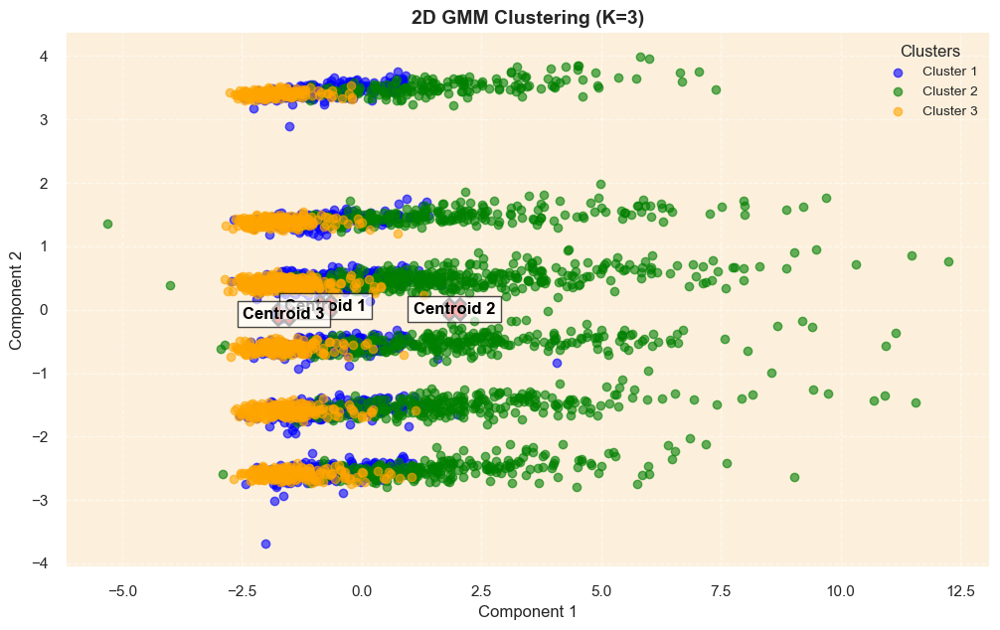

In [100]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

# Convert the dataframe to a NumPy array
X = customer_data_pca.to_numpy()

# Apply GMM clustering with K=3
k = 3
gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
labels = gmm.fit_predict(X)
centroids = gmm.means_  # GMM cluster centers

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3"}
colors = ['blue', 'green', 'orange']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Plot GMM centroids
for i, centroid in enumerate(centroids):
    plt.scatter(centroid[0], centroid[1], color='red', marker='X', s=250, edgecolors='black', linewidth=2)
    plt.text(centroid[0], centroid[1], f'Centroid {i+1}', fontsize=12, fontweight='bold', color='black', 
             ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))

# Label axes
plt.title("2D GMM Clustering (K=3)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


In 3D

In [101]:
import plotly.graph_objects as go
from sklearn.mixture import GaussianMixture

# Fit Gaussian Mixture Model only on customer_data_pca
gmm = GaussianMixture(n_components=3)
gmm.fit(customer_data_pca[['PC1', 'PC2', 'PC3']])  # Ensure only relevant columns are used

# Predict clusters
customer_data_pca['cluster'] = gmm.predict(customer_data_pca[['PC1', 'PC2', 'PC3']])

# Copy cluster labels to customer_data_cleaned
customer_data_cleaned['cluster'] = customer_data_pca['cluster'].values  # Ensure alignment

# Separate data frames for each cluster
cluster_0 = customer_data_pca[customer_data_pca['cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['cluster'] == 1]
cluster_2 = customer_data_pca[customer_data_pca['cluster'] == 2]

# Define colors for the three clusters
colors = ['blue', 'red', 'green']

# Create 3D scatter plot
fig = go.Figure()

# Add data points for each cluster
fig.add_trace(go.Scatter3d(
    x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'],
    mode='markers', marker=dict(color=colors[0], size=5, opacity=0.6), name='Cluster 0'
))

fig.add_trace(go.Scatter3d(
    x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'],
    mode='markers', marker=dict(color=colors[1], size=5, opacity=0.6), name='Cluster 1'
))

fig.add_trace(go.Scatter3d(
    x=cluster_2['PC1'], y=cluster_2['PC2'], z=cluster_2['PC3'],
    mode='markers', marker=dict(color=colors[2], size=5, opacity=0.6), name='Cluster 2'
))

# Set layout details
fig.update_layout(
    title=dict(text='3D Visualization of GMM Clustering (3 Clusters)', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()


In [102]:
customer_data_cleaned.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,cluster
0,12346.0,325,2,0,0.0,0.0,1,0.0,1,10,1,1,0.5,0.0,0.0,0.0,0
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,1,14,0,0,0.0,615.714286,341.070789,4.486071,1
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,3,19,0,0,0.0,359.31,203.875689,-100.884,1
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,9,0,0,0.0,1457.55,0.0,0.0,1
4,12350.0,310,1,196,294.4,294.4,16,0.0,2,16,0,0,0.0,294.4,0.0,0.0,0


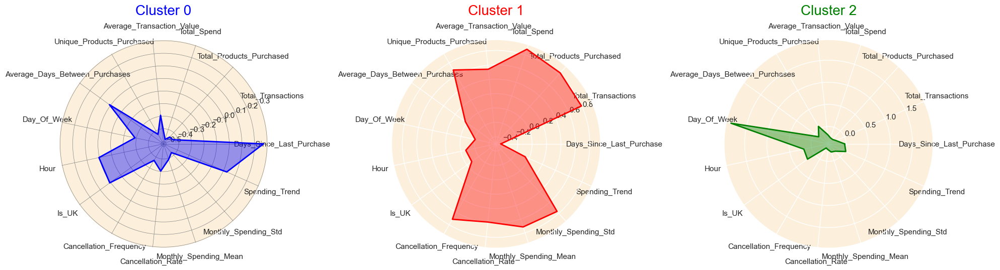

In [103]:
# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = customer_data_cleaned.set_index('CustomerID')
# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()
# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]
# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=3)

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])

ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])

ax[2].set_xticks(angles[:-1])
ax[2].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)
# Display the plot
plt.tight_layout()
plt.show()

Using DBSCAN Clustering Algorithm

In [104]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
customer_data_pca = pca.fit_transform(customer_data_scaled)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the CustomerID index back to the new PCA dataframe
customer_data_pca.index = customer_data_scaled.index
# Displaying the resulting dataframe based on the PCs
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
12346.0,-2.186469,-1.705370,-1.576745,1.008187,-0.411803,-1.658012
12347.0,3.290264,-1.387375,1.923310,-0.930990,-0.010591,0.873150
12348.0,0.584684,0.585019,0.664727,-0.655411,-0.470280,2.306657
12349.0,1.791116,-2.695652,5.850040,0.853418,0.677111,-1.520098
12350.0,-1.997139,-0.542639,0.578781,0.183682,-1.484838,0.062672


Tuning eps for DBSCAN Using a k-Distance Plot

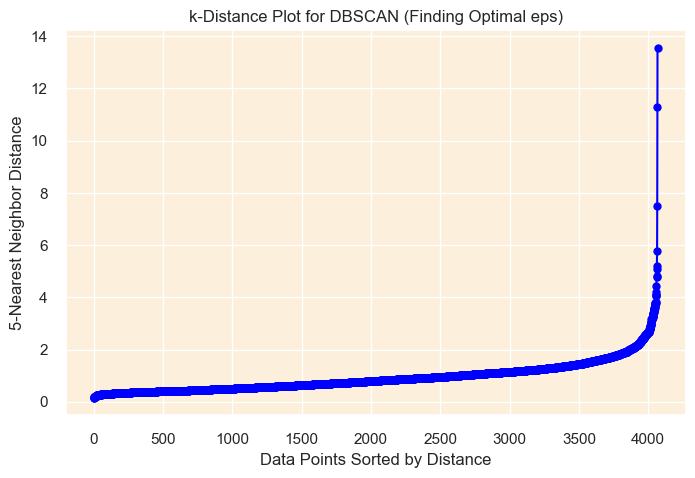

In [105]:
from sklearn.neighbors import NearestNeighbors

# Define k (min_samples) default to 5
k = 5

# Compute the k-nearest neighbors distances
nbrs = NearestNeighbors(n_neighbors=k)
nbrs.fit(customer_data_pca)
distances, indices = nbrs.kneighbors(customer_data_pca)

# Sort distances for k-th nearest neighbor
k_distances = np.sort(distances[:, k - 1])  # Extract k-th nearest distances and sort

# Plot the k-distance graph
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(k_distances) + 1), k_distances, marker='o', linestyle='-', color='blue')
plt.xlabel("Data Points Sorted by Distance")
plt.ylabel(f"{k}-Nearest Neighbor Distance")
plt.title("k-Distance Plot for DBSCAN (Finding Optimal eps)")
plt.grid(True)
plt.show()


Choosing the Optimal eps
The elbow appears around eps ≈ 2.0 (where the curve bends upwards).
How to Select min_samples. Set min_samples = 2 × PCA dimensions.
Since your dataset has 6 PCA components, start with:
min_samples = 2 × 6 = 12

In [106]:
#DBSCAN Algorithm

# Initialize DBSCAN
dbscan = DBSCAN(eps= 1.8, min_samples= 12)  # You may need to adjust eps and min_samples

# Fit DBSCAN
clusters = dbscan.fit_predict(customer_data_pca)

# Print the cluster labels
print("Cluster labels:\n", clusters)
# Silhouette Score Calculation
# Ensure there are at least 2 clusters (excluding noise points labeled -1)
unique_clusters = set(clusters) - {-1}
if len(unique_clusters) > 1:
    silhouette_avg = silhouette_score(customer_data_pca, clusters)
    print(f"Silhouette Score: {silhouette_avg:.4f}")
else:
    print("Silhouette Score cannot be calculated (only one cluster or all noise).")


Cluster labels:
 [0 0 0 ... 0 0 0]
Silhouette Score: 0.2342


In [107]:
#Computing DBSCAN
db = DBSCAN(eps=1.8, min_samples=12).fit(customer_data_pca)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

#Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

#Evaluation of DBSCAN
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(customer_data_pca, labels))


Estimated number of clusters: 2
Estimated number of noise points: 284
Silhouette Coefficient: 0.234


Visulaizing in 2D

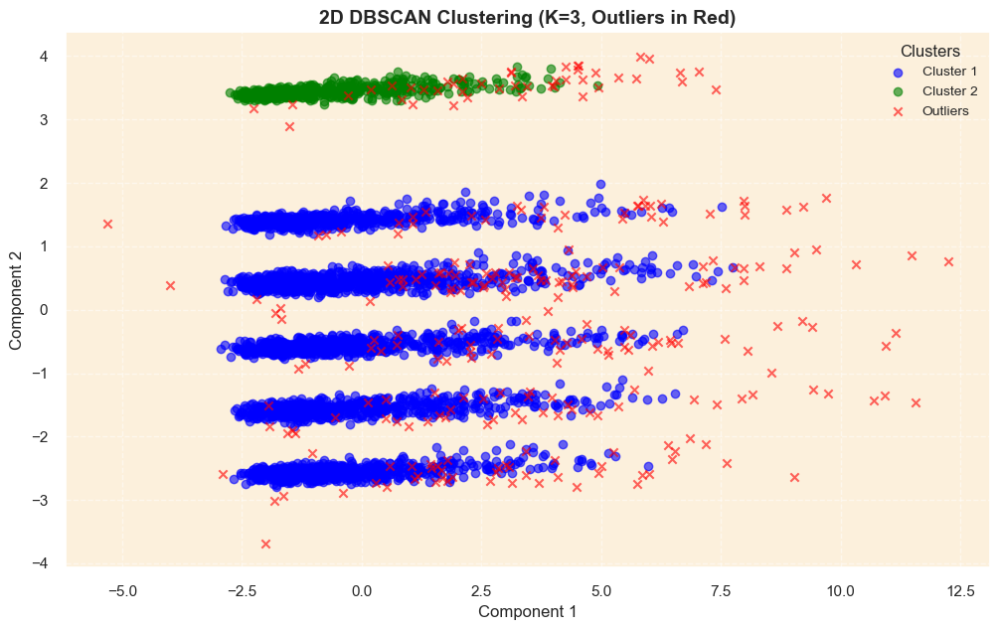

In [108]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Convert the dataframe to a NumPy array
X = customer_data_pca.to_numpy()

# Apply DBSCAN clustering
eps_value = 1.8
min_samples_value = 12
dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
labels = dbscan.fit_predict(X)

# Identify unique clusters and outliers (-1 label is assigned to outliers by DBSCAN)
unique_labels = set(labels)
colors = ['blue', 'green', 'orange']  # Colors for 3 clusters
outlier_color = 'red'  # Color for outliers

plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in unique_labels:
    if cluster == -1:
        # Plot outliers
        cluster_points = X[labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                    color=outlier_color, label="Outliers", alpha=0.6, marker='x')
    else:
        # Plot normal clusters
        cluster_points = X[labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                    color=colors[cluster], label=f"Cluster {cluster + 1}", alpha=0.6)

# Label axes
plt.title("2D DBSCAN Clustering (K=3, Outliers in Red)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


Visulaizing in 3D

In [109]:
# Fit DBSCAN to the PCA data
dbscan = DBSCAN(eps=1.8, min_samples=12)  # Adjust these parameters as necessary
customer_data_pca['cluster'] = dbscan.fit_predict(customer_data_pca)
customer_data_cleaned['cluster'] = dbscan.fit_predict(customer_data_pca)
# Separate data frames for each cluster and outliers (cluster label -1 for outliers)
cluster_0 = customer_data_pca[customer_data_pca['cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['cluster'] == 1]
outliers = customer_data_pca[customer_data_pca['cluster'] == -1]

# Define colors for the two clusters and outliers
colors = ['blue', 'red', 'black']  # blue for cluster 0, red for cluster 1, black for outliers

# Create 3D scatter plot
fig = go.Figure()

# Add data points for cluster 0
fig.add_trace(go.Scatter3d(
    x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'],
    mode='markers', marker=dict(color=colors[0], size=5, opacity=0.6), name='Cluster 0'
))

# Add data points for cluster 1
fig.add_trace(go.Scatter3d(
    x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'],
    mode='markers', marker=dict(color=colors[1], size=5, opacity=0.6), name='Cluster 1'
))

# Add data points for outliers (label -1)
fig.add_trace(go.Scatter3d(
    x=outliers['PC1'], y=outliers['PC2'], z=outliers['PC3'],
    mode='markers', marker=dict(color=colors[2], size=5, opacity=0.6), name='Outliers'
))

# Set layout details
fig.update_layout(
    title=dict(text='3D Visualization of DBSCAN Clustering (Two Clusters)', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()


In [110]:
customer_data_cleaned.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Day_Of_Week,Hour,Is_UK,Cancellation_Frequency,Cancellation_Rate,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,cluster
0,12346.0,325,2,0,0.0,0.0,1,0.0,1,10,1,1,0.5,0.0,0.0,0.0,0
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,1,14,0,0,0.0,615.714286,341.070789,4.486071,0
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,3,19,0,0,0.0,359.31,203.875689,-100.884,0
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,9,0,0,0.0,1457.55,0.0,0.0,-1
4,12350.0,310,1,196,294.4,294.4,16,0.0,2,16,0,0,0.0,294.4,0.0,0.0,0


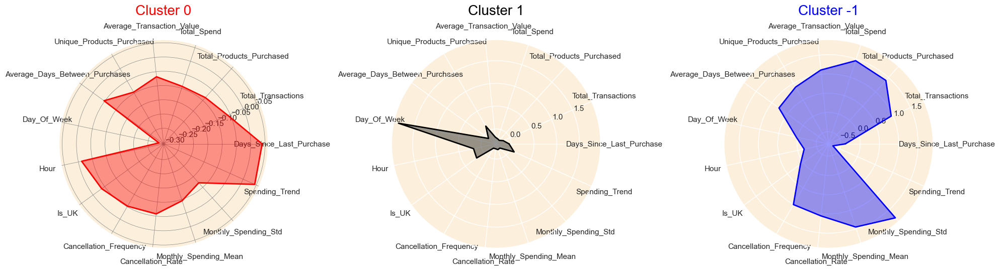

In [111]:
# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = customer_data_cleaned.set_index('CustomerID')
# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()
# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]
# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=3)

# Create radar chart for each cluster
for i, color in zip(cluster_centroids.index, colors[:len(cluster_centroids.index)]):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])

ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])

ax[2].set_xticks(angles[:-1])
ax[2].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)
# Display the plot
plt.tight_layout()
plt.show()

In [112]:
# Compute number of customers
num_observations = len(customer_data_pca)

# Separate the features and the cluster labels
X = customer_data_pca.drop('cluster', axis=1)
clusters = customer_data_pca['cluster']

# Compute the metrics
sil_score = silhouette_score(X, clusters)
calinski_score = calinski_harabasz_score(X, clusters)
davies_score = davies_bouldin_score(X, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))

+-------------------------+--------------------+
|         Metric          |       Value        |
+-------------------------+--------------------+
| Number of Observations  |        4067        |
|    Silhouette Score     | 0.2341813230361681 |
| Calinski Harabasz Score | 552.6320247760249  |
|  Davies Bouldin Score   | 1.890369383397669  |
+-------------------------+--------------------+


Using Agglomerative Clustering

In [113]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
customer_data_pca = pca.fit_transform(customer_data_scaled)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the CustomerID index back to the new PCA dataframe
customer_data_pca.index = customer_data_scaled.index
# Displaying the resulting dataframe based on the PCs
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
12346.0,-2.186469,-1.705370,-1.576745,1.008187,-0.411803,-1.658012
12347.0,3.290264,-1.387375,1.923310,-0.930990,-0.010591,0.873150
12348.0,0.584684,0.585019,0.664727,-0.655411,-0.470280,2.306657
12349.0,1.791116,-2.695652,5.850040,0.853418,0.677111,-1.520098
12350.0,-1.997139,-0.542639,0.578781,0.183682,-1.484838,0.062672


Clusters: 2, Silhouette Score: 0.2379
Clusters: 3, Silhouette Score: 0.2109
Clusters: 4, Silhouette Score: 0.1991
Clusters: 5, Silhouette Score: 0.2010
Clusters: 6, Silhouette Score: 0.1487
Clusters: 7, Silhouette Score: 0.1535
Clusters: 8, Silhouette Score: 0.1658
Clusters: 9, Silhouette Score: 0.1688


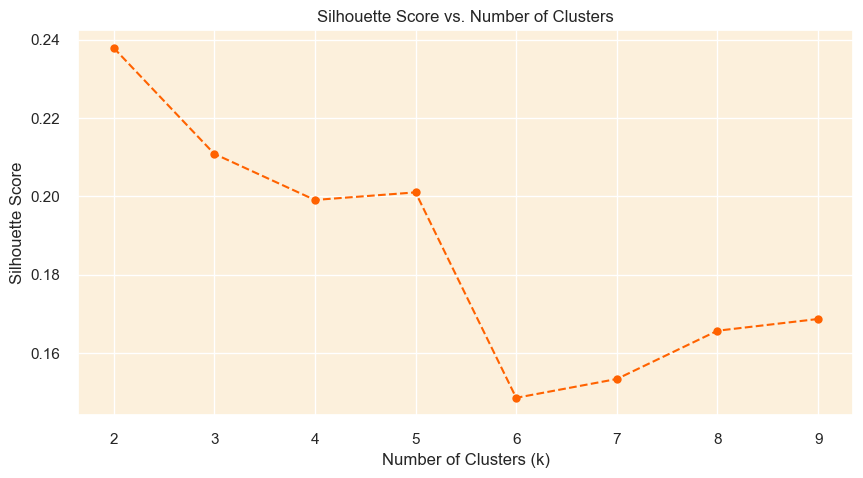

In [114]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Try different numbers of clusters (e.g., 2 to 10)
silhouette_scores = []
cluster_range = range(2, 10)  # Adjust based on dataset

for k in cluster_range:
    agg_clustering = AgglomerativeClustering(n_clusters=k, linkage='ward')
    cluster_labels = agg_clustering.fit_predict(customer_data_pca)
    
    score = silhouette_score(customer_data_pca, cluster_labels)
    silhouette_scores.append(score)
    print(f'Clusters: {k}, Silhouette Score: {score:.4f}')

# Plot Silhouette Score vs. Number of Clusters
plt.figure(figsize=(10, 5))
plt.plot(cluster_range, silhouette_scores, marker='o', linestyle='--')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs. Number of Clusters")
plt.show()

In [115]:
agg_clustering = AgglomerativeClustering(n_clusters= 2, linkage='ward')
clusters = agg_clustering.fit_predict(customer_data_pca)

# Add cluster labels to the PCA-transformed dataset
customer_data_pca['cluster'] = clusters
customer_data_cleaned['cluster'] = clusters
# Calculate Silhouette Score to evaluate clustering performance
silhouette_avg = silhouette_score(customer_data_pca.iloc[:, :-1], clusters)
print(f'Silhouette Score: {silhouette_avg:.4f}')

Silhouette Score: 0.2379


Visualizing in 2D

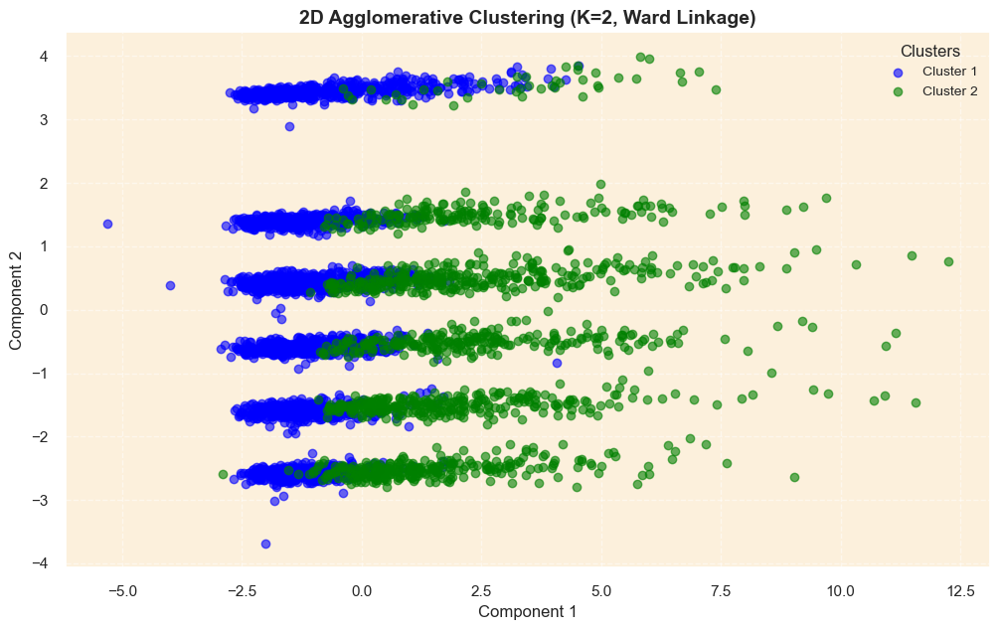

In [116]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering

# Convert the dataframe to a NumPy array
X = customer_data_pca.to_numpy()

# Apply Agglomerative Clustering with Ward linkage
k = 2
agg_clustering = AgglomerativeClustering(n_clusters=k, linkage='ward')
labels = agg_clustering.fit_predict(X)

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2"}
colors = ['blue', 'green']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Label axes
plt.title("2D Agglomerative Clustering (K=2, Ward Linkage)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


Visualizing in 3D

In [117]:
# Separate data into clusters
cluster_0 = customer_data_pca[customer_data_pca['cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['cluster'] == 1]

# Define colors for clusters
colors = ['blue', 'red']

# Create 3D scatter plot
fig = go.Figure()

# Add data points for Cluster 0
fig.add_trace(go.Scatter3d(
    x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'],
    mode='markers', marker=dict(color=colors[0], size=5, opacity=0.6), name='Cluster 0'
))

# Add data points for Cluster 1
fig.add_trace(go.Scatter3d(
    x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'],
    mode='markers', marker=dict(color=colors[1], size=5, opacity=0.6), name='Cluster 1'
))

# Set layout details
fig.update_layout(
    title=dict(text='3D Visualization of Agglomerative Clustering (2 Clusters)', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()

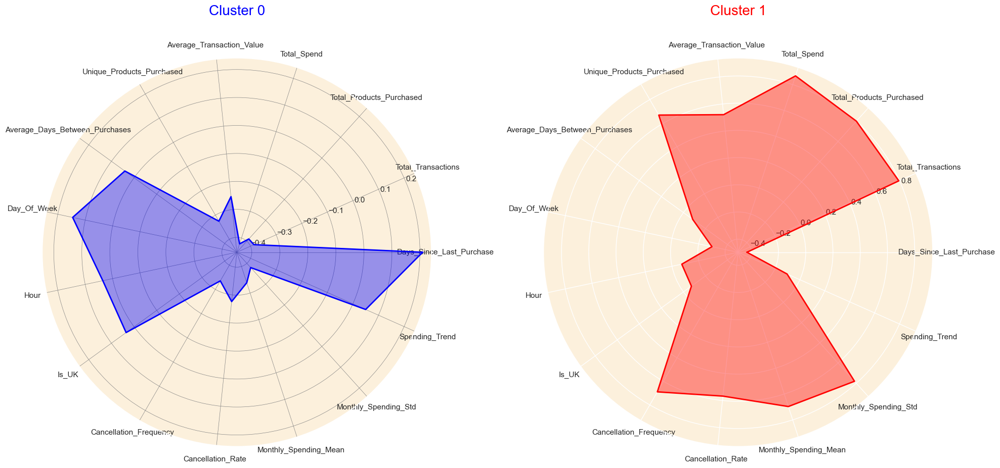

In [118]:
# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = customer_data_cleaned.set_index('CustomerID')
# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()
# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]
# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=2)

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])

ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])


# Add a grid
ax[0].grid(color='grey', linewidth=0.5)
# Display the plot
plt.tight_layout()
plt.show()

Using BIRCH Algorithm for Clustering

In [119]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
customer_data_pca = pca.fit_transform(customer_data_scaled)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the CustomerID index back to the new PCA dataframe
customer_data_pca.index = customer_data_scaled.index
# Displaying the resulting dataframe based on the PCs
customer_data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
12346.0,-2.186469,-1.705370,-1.576745,1.008187,-0.411803,-1.658012
12347.0,3.290264,-1.387375,1.923310,-0.930990,-0.010591,0.873150
12348.0,0.584684,0.585019,0.664727,-0.655411,-0.470280,2.306657
12349.0,1.791116,-2.695652,5.850040,0.853418,0.677111,-1.520098
12350.0,-1.997139,-0.542639,0.578781,0.183682,-1.484838,0.062672


Using GridSearch Method

In [120]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import Birch
from sklearn.metrics import make_scorer

# Custom scorer for clustering (Silhouette Score)
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    return silhouette_score(X, labels)

# Define parameter grid
param_grid = {
    'threshold': np.arange(0.01, 0.1, 1.1),
    'branching_factor': [25, 50, 75, 100]
}

# Initialize Grid Search
birch = Birch(n_clusters=None)
grid_search = GridSearchCV(birch, param_grid, scoring=make_scorer(silhouette_scorer), cv=3)

# Fit Grid Search
grid_search.fit(customer_data_pca)

# Print best parameters
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'branching_factor': 25, 'threshold': 0.01}


In [121]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import Birch
from sklearn import metrics

# Apply BIRCH clustering
model_br = Birch(n_clusters= 3, threshold=0.01, branching_factor=25)
model_br.fit(customer_data_pca)

# Predict clusters
yhat_br = model_br.predict(customer_data_pca)

# Get unique clusters
clusters_br = np.unique(yhat_br)
print("Clusters of Birch:", clusters_br)

# Get labels
labels_br = model_br.labels_


# Compute silhouette score
score_br = metrics.silhouette_score(customer_data_pca, labels_br)
print("Score of Birch = ", score_br)

Clusters of Birch: [0 1 2]
Score of Birch =  0.2108764708873987


Visualizing in 2D

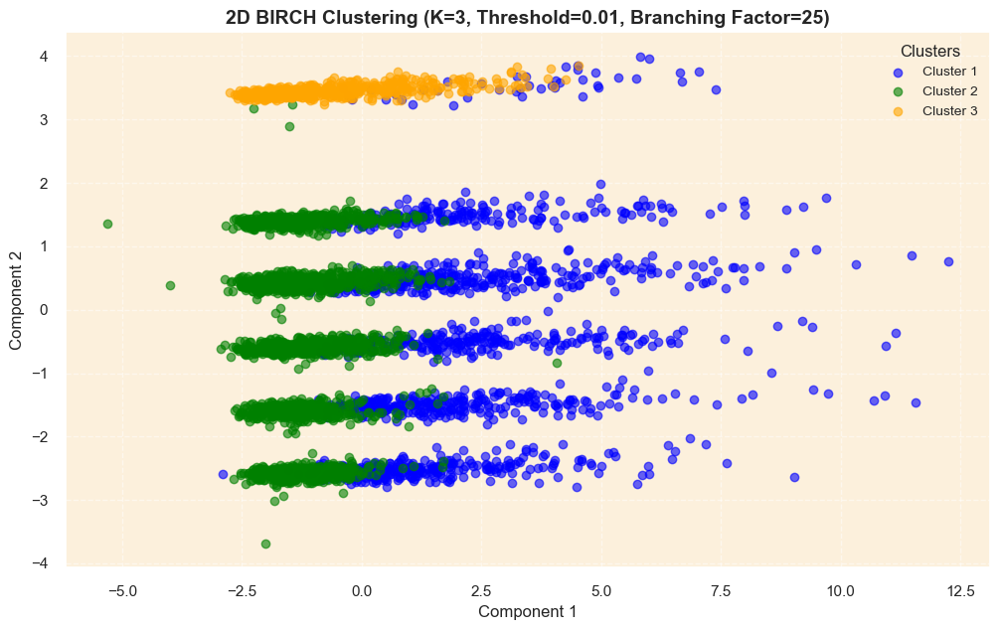

In [122]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import Birch

# Convert the dataframe to a NumPy array
X = customer_data_pca.to_numpy()

# Apply BIRCH clustering
k = 3
birch = Birch(n_clusters=k, threshold=0.01, branching_factor=25)
labels = birch.fit_predict(X)

# Define cluster colors and names
cluster_names = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3"}
colors = ['blue', 'green', 'orange']

# Create a 2D scatter plot
plt.figure(figsize=(12, 7))

# Plot each cluster with its label
for cluster in range(k):
    cluster_points = X[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                color=colors[cluster], label=cluster_names[cluster], alpha=0.6)

# Label axes
plt.title("2D BIRCH Clustering (K=3, Threshold=0.01, Branching Factor=25)", fontsize=14, fontweight='bold')
plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()


Visualizing in 3D

In [123]:
import numpy as np
import plotly.graph_objects as go
from sklearn.cluster import Birch
from sklearn import metrics

# Apply BIRCH clustering
model_br = Birch(n_clusters= 3, threshold=0.01, branching_factor=25)
model_br.fit(customer_data_pca)
# Predict clusters
yhat_br = model_br.predict(customer_data_pca)

# Extract PC1, PC2, and PC3
pc1 = customer_data_pca.iloc[:, 0]
pc2 = customer_data_pca.iloc[:, 1]
pc3 = customer_data_pca.iloc[:, 2]

# Define colors
colors = ['blue', 'red', 'green']

# Create 3D Scatter Plot
fig = go.Figure()

# Plot each cluster
for cluster_id in np.unique(yhat_br):
    cluster_data = customer_data_pca[yhat_br == cluster_id]
    fig.add_trace(go.Scatter3d(
        x=cluster_data.iloc[:, 0], 
        y=cluster_data.iloc[:, 1], 
        z=cluster_data.iloc[:, 2],
        mode='markers',
        marker=dict(color=colors[cluster_id % len(colors)], size=5, opacity=0.7),
        name=f'Cluster {cluster_id}'
    ))

# Update Layout
fig.update_layout(
    title="3D Visualization of BIRCH Clustering",
    scene=dict(
        xaxis_title="PC1",
        yaxis_title="PC2",
        zaxis_title="PC3"
    ),
    width=900,
    height=800
)

# Show plot
fig.show()

Recommendation System